In [1]:
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.preprocessing import LabelEncoder

from sklearn.naive_bayes import MultinomialNB, ComplementNB
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

from data_utils import *
from models_utils import *

In [2]:
df = get_raw_data('../data/allNamesClean.csv')

In [3]:
df_translit_ru = filter_data(df)

In [4]:
le, X_train, X_test, y_train, y_test = split_data(df_translit_ru)

# Models

## Naive Bayes

Fitting 3 folds for each of 96 candidates, totalling 288 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:  1.3min
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:  5.5min
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed: 12.6min
[Parallel(n_jobs=6)]: Done 288 out of 288 | elapsed: 13.1min finished


{'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.05, 'vect__min_df': 10, 'vect__ngram_range': (1, 5)}


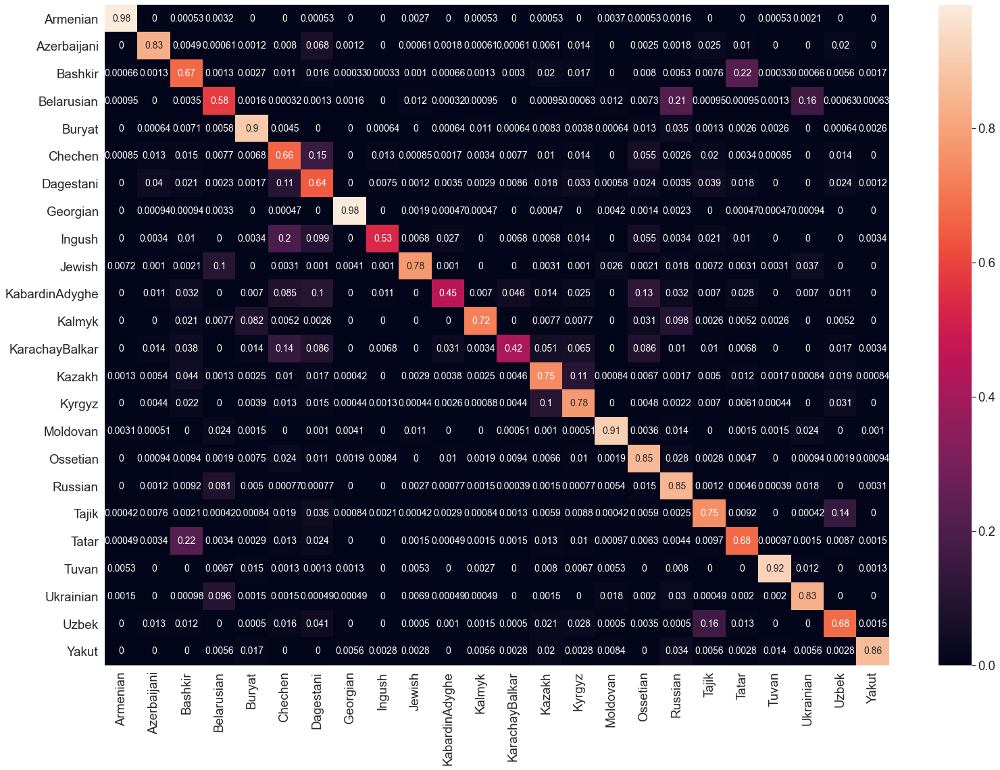

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9836	0.9836	0.9836	0.9836
Azerbaijani    	0.8336	0.8824	0.8336	0.8573
Bashkir        	0.6729	0.7205	0.6729	0.6959
Belarusian     	0.5807	0.7493	0.5807	0.6543
Buryat         	0.8987	0.9134	0.8987	0.9060
Chechen        	0.6610	0.5815	0.6610	0.6187
Dagestani      	0.6431	0.6031	0.6431	0.6225
Georgian       	0.9812	0.9859	0.9812	0.9835
Ingush         	0.5342	0.7429	0.5342	0.6215
Jewish         	0.7774	0.8663	0.7774	0.8195
KabardinAdyghe 	0.4507	0.6368	0.4507	0.5278
Kalmyk         	0.7216	0.8092	0.7216	0.7629
KarachayBalkar 	0.4178	0.5728	0.4178	0.4832
Kazakh         	0.7486	0.7817	0.7486	0.7648
Kyrgyz         	0.7787	0.7594	0.7787	0.7689
Moldovan       	0.9068	0.9230	0.9068	0.9148
Ossetian       	0.8546	0.7035	0.8546	0.7717
Russian        	0.8466	0.6915	0.8466	0.7613
Tajik          	0.7546	0.7607	0.7546	0.7576
Tatar          	0.6754	0.6176	0.6754	0.6452
Tuvan          	0.9200	0.9504	0.9200	0.9350
Ukrainian      	0.8337	0.7161	0.8337	0.7705


In [ ]:
mnb = proc_model(MultinomialNB(), {}, le, X_train, y_train, X_test, y_test, vectorization='count')

Fitting 3 folds for each of 96 candidates, totalling 288 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:  1.1min
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:  5.0min
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed: 11.8min
[Parallel(n_jobs=6)]: Done 288 out of 288 | elapsed: 12.4min finished


{'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.05, 'vect__min_df': 1, 'vect__ngram_range': (1, 7)}


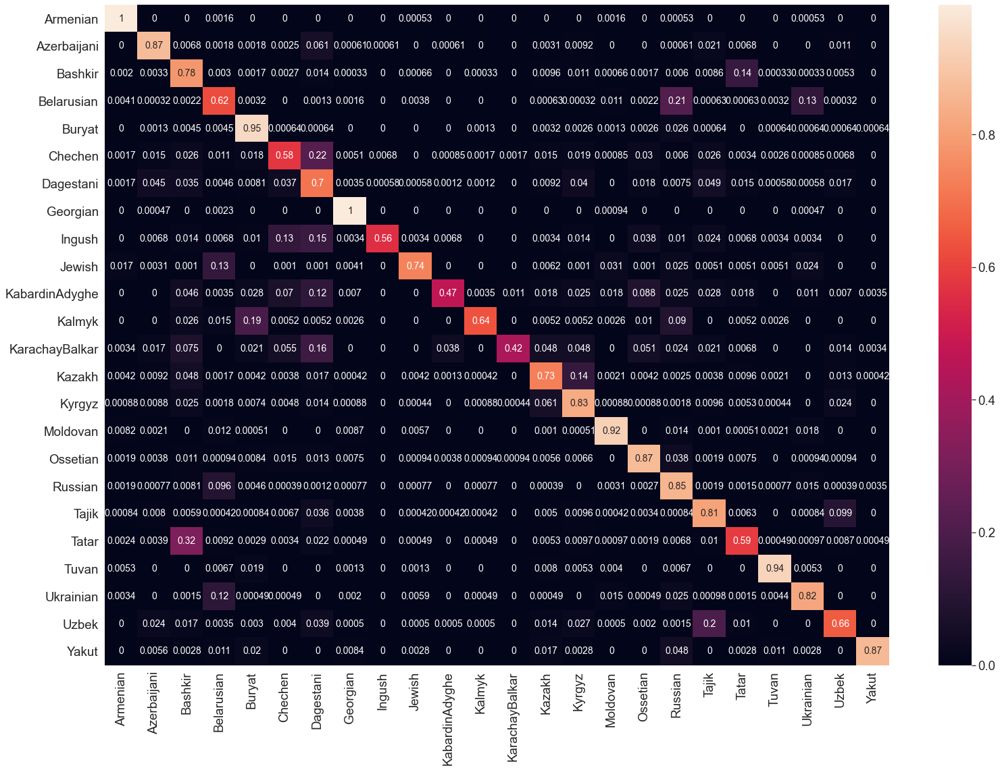

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9952	0.9518	0.9952	0.9730
Azerbaijani    	0.8723	0.8504	0.8723	0.8612
Bashkir        	0.7845	0.6858	0.7845	0.7318
Belarusian     	0.6227	0.7260	0.6227	0.6704
Buryat         	0.9487	0.8665	0.9487	0.9058
Chechen        	0.5790	0.7508	0.5790	0.6538
Dagestani      	0.7041	0.5946	0.7041	0.6447
Georgian       	0.9958	0.9654	0.9958	0.9804
Ingush         	0.5582	0.9422	0.5582	0.7011
Jewish         	0.7374	0.9242	0.7374	0.8203
KabardinAdyghe 	0.4683	0.8365	0.4683	0.6005
Kalmyk         	0.6366	0.9321	0.6366	0.7565
KarachayBalkar 	0.4178	0.9457	0.4178	0.5796
Kazakh         	0.7302	0.8472	0.7302	0.7844
Kyrgyz         	0.8304	0.7556	0.8304	0.7912
Moldovan       	0.9249	0.9301	0.9249	0.9275
Ossetian       	0.8696	0.8420	0.8696	0.8556
Russian        	0.8547	0.6901	0.8547	0.7636
Tajik          	0.8117	0.7448	0.8117	0.7768
Tatar          	0.5905	0.6769	0.5905	0.6307
Tuvan          	0.9373	0.9348	0.9373	0.9361
Ukrainian      	0.8200	0.7588	0.8200	0.7882


In [ ]:
cnb = proc_model(ComplementNB(), {}, le, X_train, y_train, X_test, y_test, vectorization='count')

Fitting 3 folds for each of 96 candidates, totalling 288 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:  1.1min
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:  5.5min
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed: 13.3min
[Parallel(n_jobs=6)]: Done 288 out of 288 | elapsed: 13.9min finished


{'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.05, 'vect__min_df': 1, 'vect__ngram_range': (1, 7)}


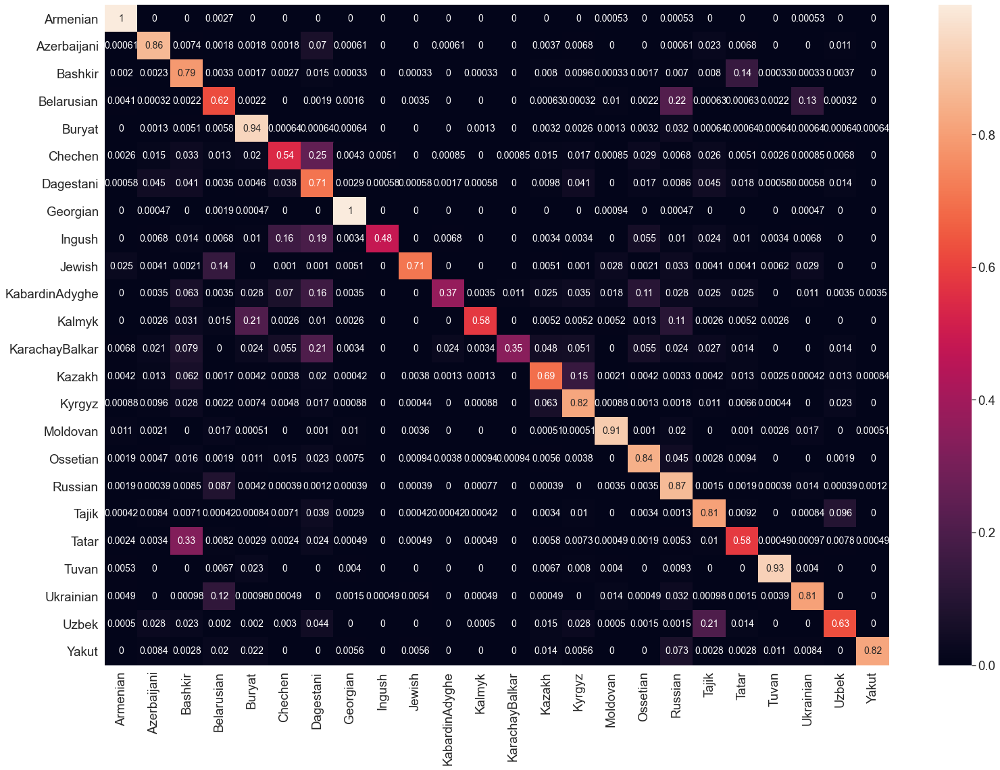

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9958	0.9442	0.9958	0.9693
Azerbaijani    	0.8637	0.8390	0.8637	0.8512
Bashkir        	0.7894	0.6656	0.7894	0.7223
Belarusian     	0.6224	0.7229	0.6224	0.6689
Buryat         	0.9385	0.8612	0.9385	0.8982
Chechen        	0.5448	0.7359	0.5448	0.6261
Dagestani      	0.7052	0.5571	0.7052	0.6225
Georgian       	0.9953	0.9659	0.9953	0.9804
Ingush         	0.4829	0.9463	0.4829	0.6395
Jewish         	0.7097	0.9364	0.7097	0.8075
KabardinAdyghe 	0.3732	0.8281	0.3732	0.5146
Kalmyk         	0.5825	0.9262	0.5825	0.7152
KarachayBalkar 	0.3459	0.9528	0.3459	0.5075
Kazakh         	0.6934	0.8408	0.6934	0.7600
Kyrgyz         	0.8190	0.7491	0.8190	0.7825
Moldovan       	0.9115	0.9346	0.9115	0.9229
Ossetian       	0.8433	0.8263	0.8433	0.8347
Russian        	0.8686	0.6736	0.8686	0.7588
Tajik          	0.8083	0.7389	0.8083	0.7720
Tatar          	0.5847	0.6588	0.5847	0.6195
Tuvan          	0.9293	0.9368	0.9293	0.9331
Ukrainian      	0.8057	0.7590	0.8057	0.7817


In [ ]:
cnb_tfidf = proc_model(ComplementNB(), {}, le, X_train, y_train, X_test, y_test, vectorization='tfidf')

## SVM

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed: 14.8min
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed: 72.6min
[Parallel(n_jobs=6)]: Done 216 out of 216 | elapsed: 119.1min finished


{'model__alpha': 2.5e-05, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'hinge', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.65, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


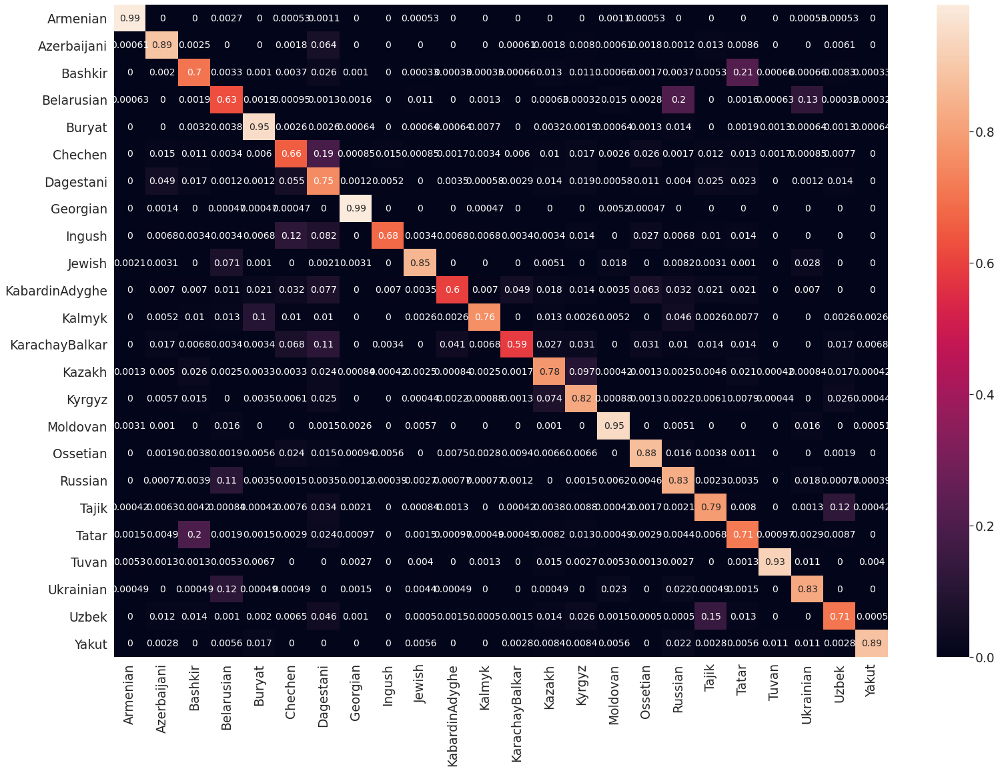

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9926	0.9879	0.9926	0.9902
Azerbaijani    	0.8895	0.8739	0.8895	0.8817
Bashkir        	0.7021	0.7721	0.7021	0.7354
Belarusian     	0.6253	0.7434	0.6253	0.6793
Buryat         	0.9513	0.9258	0.9513	0.9383
Chechen        	0.6558	0.7356	0.6558	0.6935
Dagestani      	0.7524	0.6031	0.7524	0.6696
Georgian       	0.9911	0.9814	0.9911	0.9862
Ingush         	0.6815	0.8397	0.6815	0.7524
Jewish         	0.8544	0.9045	0.8544	0.8787
KabardinAdyghe 	0.5986	0.7692	0.5986	0.6733
Kalmyk         	0.7629	0.8680	0.7629	0.8121
KarachayBalkar 	0.5856	0.7533	0.5856	0.6590
Kazakh         	0.7800	0.8390	0.7800	0.8084
Kyrgyz         	0.8199	0.7992	0.8199	0.8094
Moldovan       	0.9470	0.9172	0.9470	0.9319
Ossetian       	0.8752	0.8736	0.8752	0.8744
Russian        	0.8343	0.7205	0.8343	0.7732
Tajik          	0.7932	0.8026	0.7932	0.7979
Tatar          	0.7137	0.6257	0.7137	0.6668
Tuvan          	0.9293	0.9776	0.9293	0.9528
Ukrainian      	0.8254	0.7562	0.8254	0.7893


In [ ]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['hinge'], 'penalty' : ['elasticnet'], 'alpha' : [0.000025, 0.00005, 0.0001],
                  'early_stopping' : [False], 'class_weight': [None, 'balanced'], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.65, 0.7, 0.75],
                     'min_df': [1, 5, 10, 50],
                     'lowercase': [False],
                 })

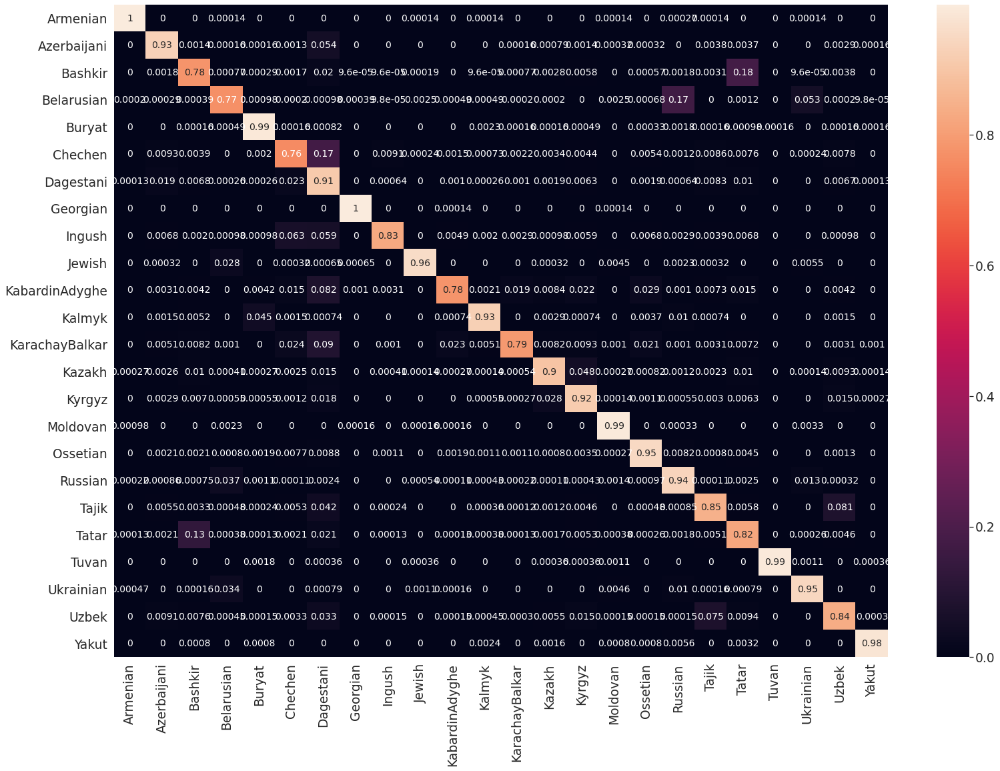

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9989	0.9977	0.9989	0.9983
Azerbaijani    	0.9296	0.9354	0.9296	0.9325
Bashkir        	0.7783	0.8571	0.7783	0.8158
Belarusian     	0.7698	0.9189	0.7698	0.8378
Buryat         	0.9915	0.9802	0.9915	0.9858
Chechen        	0.7602	0.8732	0.7602	0.8128
Dagestani      	0.9117	0.7388	0.9117	0.8162
Georgian       	0.9997	0.9987	0.9997	0.9992
Ingush         	0.8299	0.9350	0.8299	0.8793
Jewish         	0.9575	0.9850	0.9575	0.9710
KabardinAdyghe 	0.7803	0.9233	0.7803	0.8458
Kalmyk         	0.9256	0.9544	0.9256	0.9398
KarachayBalkar 	0.7891	0.9208	0.7891	0.8499
Kazakh         	0.8954	0.9482	0.8954	0.9211
Kyrgyz         	0.9151	0.9017	0.9151	0.9083
Moldovan       	0.9926	0.9840	0.9926	0.9883
Ossetian       	0.9522	0.9612	0.9522	0.9567
Russian        	0.9381	0.8210	0.9381	0.8756
Tajik          	0.8486	0.9020	0.8486	0.8745
Tatar          	0.8223	0.7341	0.8223	0.7757
Tuvan          	0.9943	0.9996	0.9943	0.9970
Ukrainian      	0.9470	0.8951	0.9470	0.9203


{'accuracy': 0.8958905951242829,
 'f1 macro': 0.9054332312140897,
 'precision macro': 0.9166604249782209,
 'recall macro': 0.897949237901511}

In [ ]:
test_model(svm, le, X_train, y_train)

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed: 28.6min
[Parallel(n_jobs=6)]: Done  54 out of  54 | elapsed: 40.3min finished


{'model__alpha': 5e-05, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'modified_huber', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.65, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


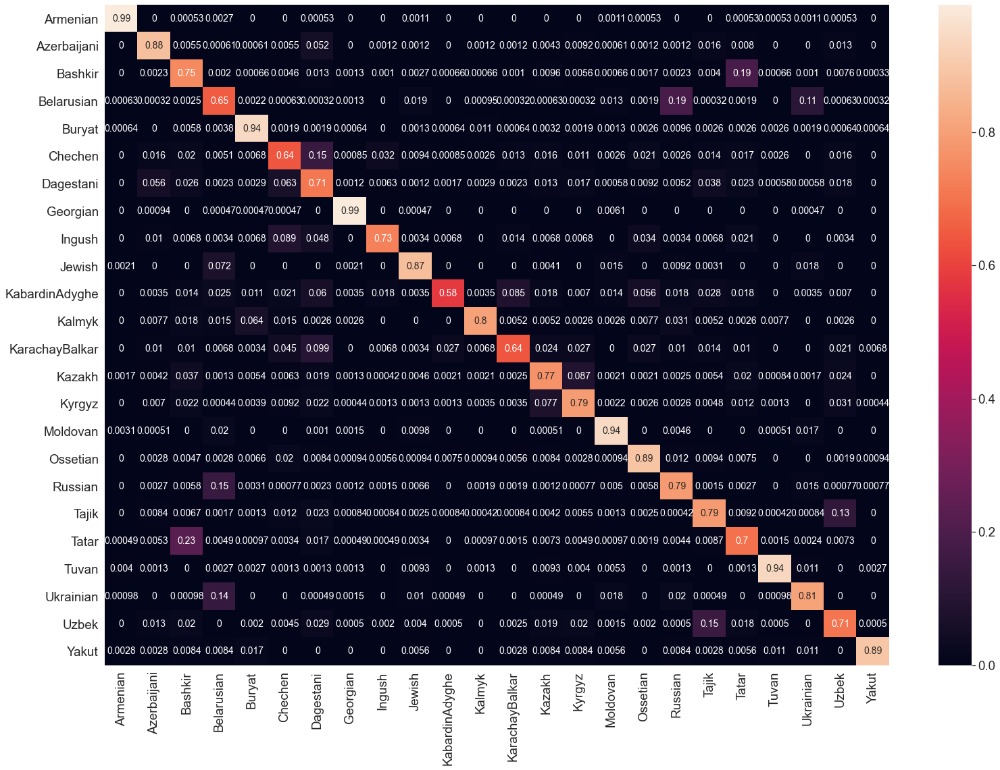

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9910	0.9884	0.9910	0.9897
Azerbaijani    	0.8772	0.8593	0.8772	0.8682
Bashkir        	0.7493	0.7389	0.7493	0.7441
Belarusian     	0.6531	0.7074	0.6531	0.6792
Buryat         	0.9423	0.9310	0.9423	0.9366
Chechen        	0.6405	0.7177	0.6405	0.6769
Dagestani      	0.7087	0.6625	0.7087	0.6848
Georgian       	0.9906	0.9837	0.9906	0.9871
Ingush         	0.7295	0.7245	0.7295	0.7270
Jewish         	0.8738	0.8161	0.8738	0.8440
KabardinAdyghe 	0.5845	0.8177	0.5845	0.6817
Kalmyk         	0.8015	0.8428	0.8015	0.8217
KarachayBalkar 	0.6404	0.6703	0.6404	0.6550
Kazakh         	0.7675	0.8333	0.7675	0.7990
Kyrgyz         	0.7901	0.8286	0.7901	0.8089
Moldovan       	0.9413	0.9191	0.9413	0.9301
Ossetian       	0.8893	0.8745	0.8893	0.8819
Russian        	0.7877	0.7310	0.7877	0.7583
Tajik          	0.7882	0.7865	0.7882	0.7873
Tatar          	0.6958	0.6376	0.6958	0.6654
Tuvan          	0.9400	0.9579	0.9400	0.9489
Ukrainian      	0.8052	0.7740	0.8052	0.7893


In [5]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['modified_huber'], 'penalty' : ['elasticnet'], 'alpha' : [0.000025, 0.00005],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.65, 0.7, 0.75],
                     'min_df': [1, 5, 0.1],
                     'lowercase': [False],
                 })

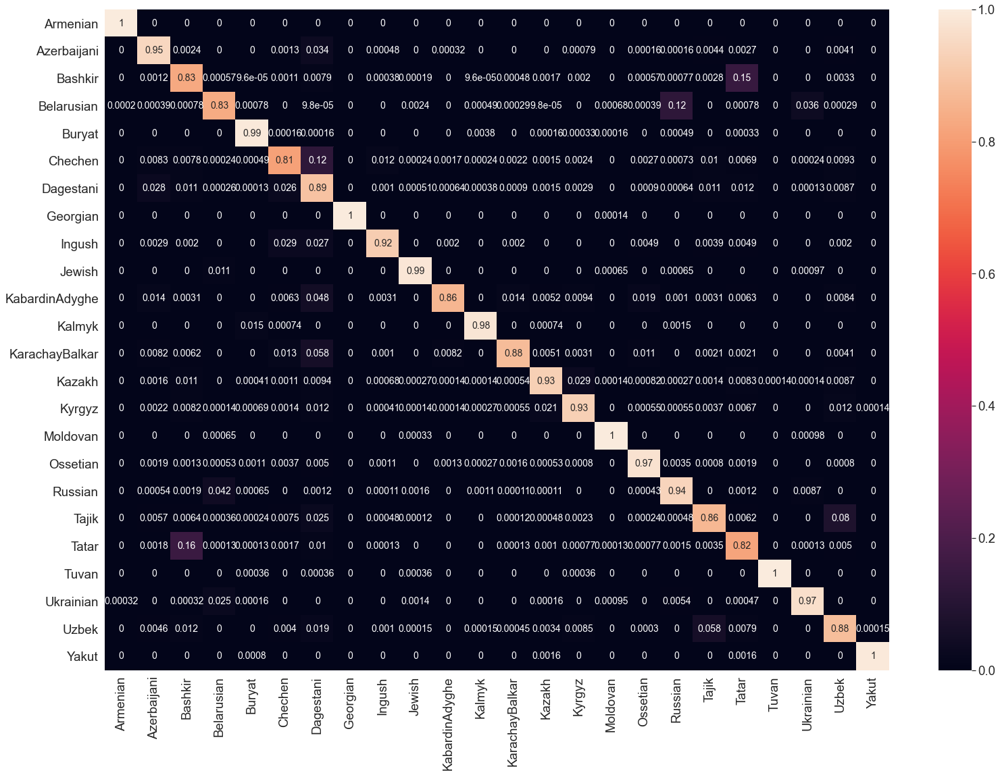

Ethnos          Acc	Prec	Rec	F1
Armenian       	1.0000	0.9995	1.0000	0.9997
Azerbaijani    	0.9491	0.9331	0.9491	0.9411
Bashkir        	0.8309	0.8388	0.8309	0.8348
Belarusian     	0.8338	0.9338	0.8338	0.8809
Buryat         	0.9945	0.9907	0.9945	0.9926
Chechen        	0.8098	0.8910	0.8098	0.8485
Dagestani      	0.8937	0.8209	0.8937	0.8558
Georgian       	0.9999	1.0000	0.9999	0.9999
Ingush         	0.9189	0.9091	0.9189	0.9140
Jewish         	0.9864	0.9794	0.9864	0.9828
KabardinAdyghe 	0.8598	0.9637	0.8598	0.9088
Kalmyk         	0.9816	0.9652	0.9816	0.9733
KarachayBalkar 	0.8776	0.9353	0.8776	0.9055
Kazakh         	0.9259	0.9652	0.9259	0.9452
Kyrgyz         	0.9289	0.9482	0.9289	0.9385
Moldovan       	0.9980	0.9969	0.9980	0.9975
Ossetian       	0.9740	0.9768	0.9740	0.9754
Russian        	0.9404	0.8665	0.9404	0.9020
Tajik          	0.8649	0.9164	0.8649	0.8899
Tatar          	0.8169	0.7685	0.8169	0.7920
Tuvan          	0.9986	0.9996	0.9986	0.9991
Ukrainian      	0.9655	0.9296	0.9655	0.9472


{'accuracy': 0.9168857552581262,
 'precision macro': 0.9323792081456249,
 'recall macro': 0.9260708771481317,
 'f1 macro': 0.9286213161302488}

In [6]:
test_model(svm, le, X_train, y_train)

Fitting 3 folds for each of 15 candidates, totalling 45 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:  6.0min
[Parallel(n_jobs=6)]: Done  45 out of  45 | elapsed: 10.4min finished


{'model__alpha': 5e-06, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'hinge', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.55, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


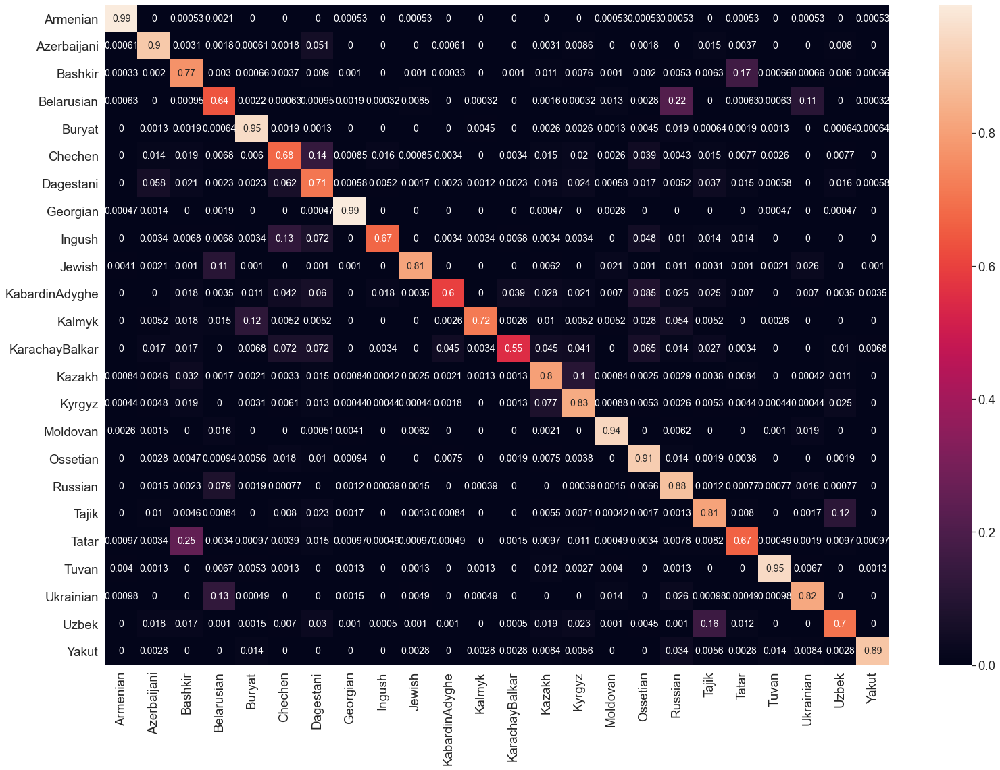

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9931	0.9873	0.9931	0.9902
Azerbaijani    	0.9006	0.8604	0.9006	0.8800
Bashkir        	0.7695	0.7477	0.7695	0.7584
Belarusian     	0.6398	0.7522	0.6398	0.6915
Buryat         	0.9532	0.9300	0.9532	0.9414
Chechen        	0.6763	0.7361	0.6763	0.7049
Dagestani      	0.7087	0.6866	0.7087	0.6975
Georgian       	0.9916	0.9814	0.9916	0.9865
Ingush         	0.6747	0.8312	0.6747	0.7448
Jewish         	0.8113	0.9102	0.8113	0.8579
KabardinAdyghe 	0.5951	0.7824	0.5951	0.6760
Kalmyk         	0.7165	0.9360	0.7165	0.8117
KarachayBalkar 	0.5514	0.8090	0.5514	0.6558
Kazakh         	0.8009	0.8283	0.8009	0.8144
Kyrgyz         	0.8273	0.8017	0.8273	0.8143
Moldovan       	0.9408	0.9370	0.9408	0.9389
Ossetian       	0.9146	0.8118	0.9146	0.8602
Russian        	0.8832	0.7136	0.8832	0.7894
Tajik          	0.8091	0.7890	0.8091	0.7989
Tatar          	0.6652	0.6818	0.6652	0.6734
Tuvan          	0.9493	0.9635	0.9493	0.9563
Ukrainian      	0.8195	0.7807	0.8195	0.7996


In [8]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['hinge'], 'penalty' : ['elasticnet'], 'alpha' : [0.000005, 0.00001, 0.00005],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='tfidf', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.45, 0.5, 0.55, 0.6, 0.65],
                     'min_df': [1],
                     'lowercase': [False],
                 })

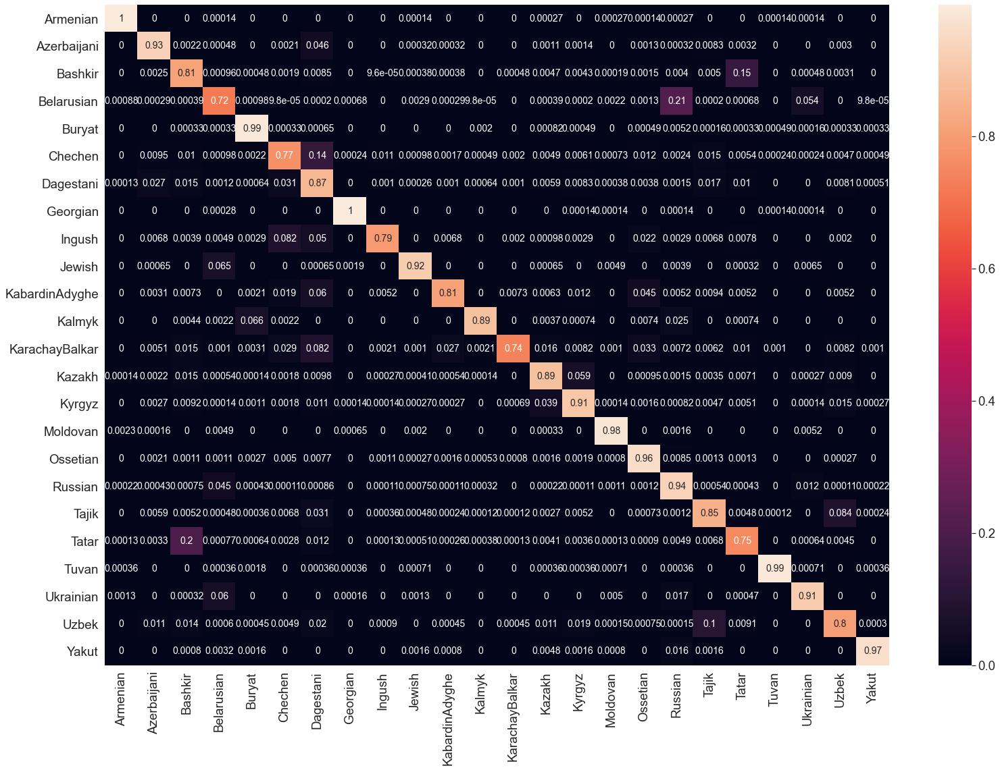

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9985	0.9950	0.9985	0.9968
Azerbaijani    	0.9299	0.9216	0.9299	0.9257
Bashkir        	0.8145	0.8026	0.8145	0.8085
Belarusian     	0.7195	0.8704	0.7195	0.7878
Buryat         	0.9876	0.9730	0.9876	0.9802
Chechen        	0.7699	0.8473	0.7699	0.8068
Dagestani      	0.8656	0.7881	0.8656	0.8250
Georgian       	0.9990	0.9971	0.9990	0.9981
Ingush         	0.7947	0.9125	0.7947	0.8495
Jewish         	0.9152	0.9694	0.9152	0.9415
KabardinAdyghe 	0.8086	0.9083	0.8086	0.8556
Kalmyk         	0.8873	0.9741	0.8873	0.9287
KarachayBalkar 	0.7397	0.9436	0.7397	0.8293
Kazakh         	0.8875	0.9165	0.8875	0.9017
Kyrgyz         	0.9052	0.8904	0.9052	0.8977
Moldovan       	0.9828	0.9836	0.9828	0.9832
Ossetian       	0.9605	0.9296	0.9605	0.9448
Russian        	0.9352	0.7700	0.9352	0.8446
Tajik          	0.8503	0.8597	0.8503	0.8550
Tatar          	0.7541	0.7569	0.7541	0.7555
Tuvan          	0.9932	0.9971	0.9932	0.9952
Ukrainian      	0.9146	0.8874	0.9146	0.9008


{'accuracy': 0.881677222753346,
 'precision macro': 0.9047911464467587,
 'recall macro': 0.8826400673281304,
 'f1 macro': 0.8919553611332}

In [9]:
test_model(svm, le, X_train, y_train)

### Huber loss

Fitting 3 folds for each of 12 candidates, totalling 36 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed: 12.6min
[Parallel(n_jobs=6)]: Done  36 out of  36 | elapsed: 18.4min finished


{'model__alpha': 7.5e-05, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'modified_huber', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.675, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


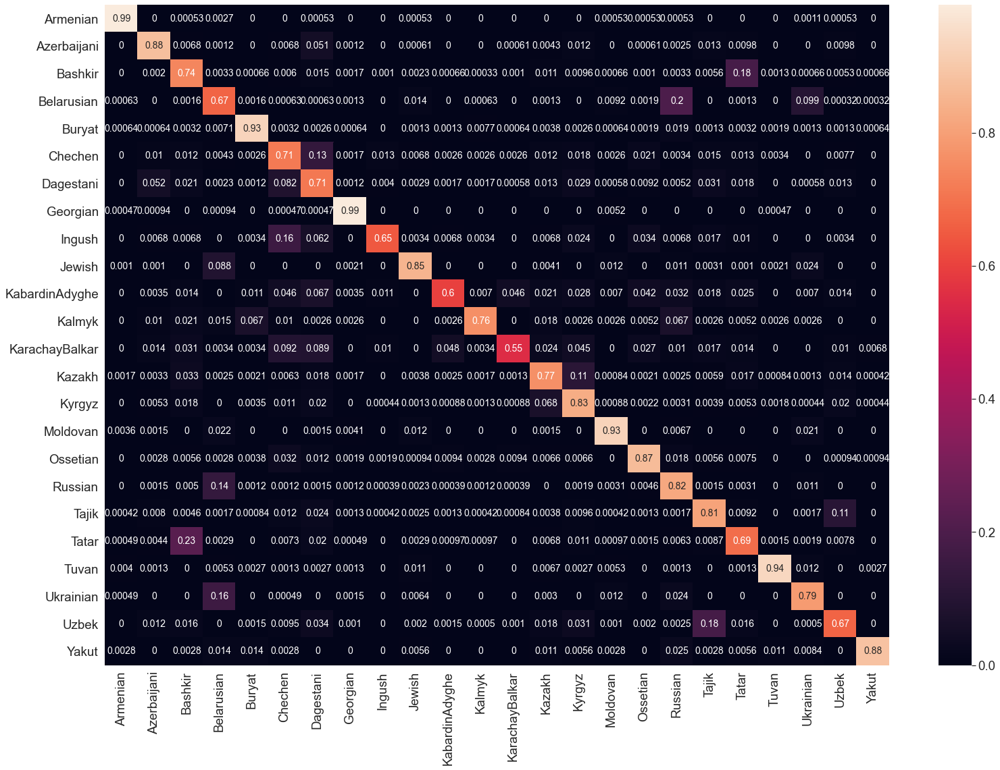

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9926	0.9879	0.9926	0.9902
Azerbaijani    	0.8797	0.8743	0.8797	0.8770
Bashkir        	0.7426	0.7508	0.7426	0.7467
Belarusian     	0.6682	0.7041	0.6682	0.6857
Buryat         	0.9340	0.9510	0.9340	0.9424
Chechen        	0.7139	0.6704	0.7139	0.6915
Dagestani      	0.7110	0.6608	0.7110	0.6850
Georgian       	0.9911	0.9782	0.9911	0.9846
Ingush         	0.6473	0.8400	0.6473	0.7311
Jewish         	0.8503	0.8459	0.8503	0.8481
KabardinAdyghe 	0.5986	0.7589	0.5986	0.6693
Kalmyk         	0.7603	0.8754	0.7603	0.8138
KarachayBalkar 	0.5514	0.7931	0.5514	0.6505
Kazakh         	0.7675	0.8387	0.7675	0.8015
Kyrgyz         	0.8322	0.7783	0.8322	0.8043
Moldovan       	0.9269	0.9424	0.9269	0.9346
Ossetian       	0.8687	0.8861	0.8687	0.8773
Russian        	0.8208	0.7126	0.8208	0.7629
Tajik          	0.8075	0.7803	0.8075	0.7937
Tatar          	0.6870	0.6475	0.6870	0.6667
Tuvan          	0.9387	0.9617	0.9387	0.9501
Ukrainian      	0.7900	0.7853	0.7900	0.7876


In [19]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['modified_huber'], 'penalty' : ['elasticnet'], 'alpha' : [0.00005, 0.000075],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.625, 0.65, 0.675],
                     'min_df': [1, 5],
                     'lowercase': [False],
                 })

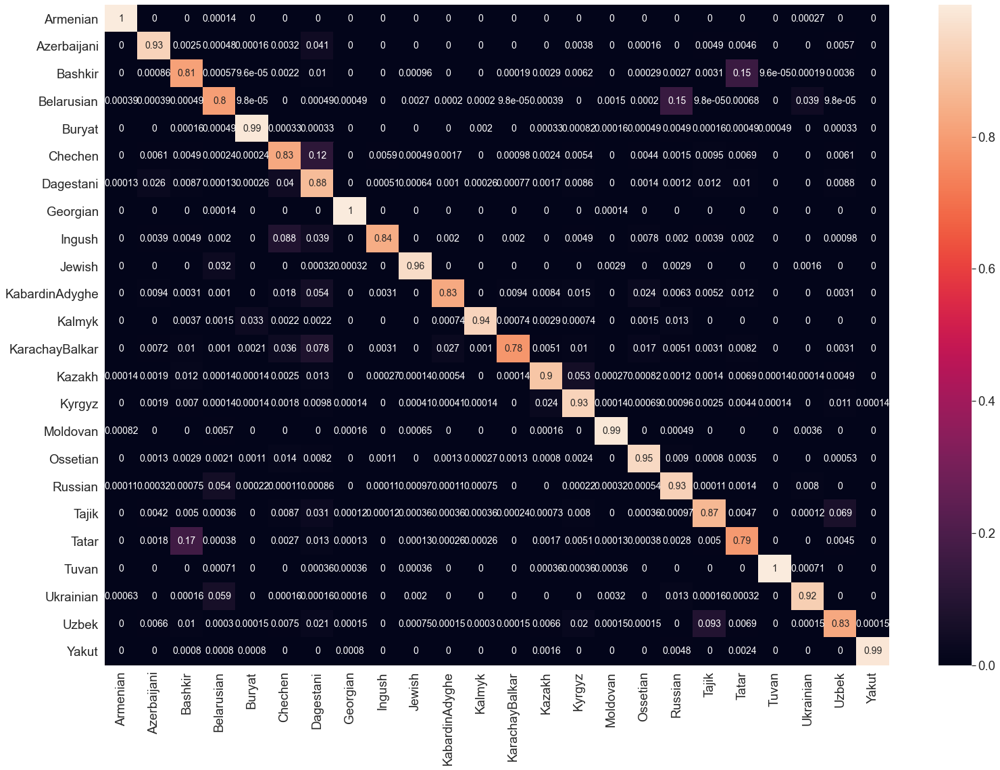

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9996	0.9978	0.9996	0.9987
Azerbaijani    	0.9336	0.9373	0.9336	0.9354
Bashkir        	0.8112	0.8294	0.8112	0.8202
Belarusian     	0.8019	0.8868	0.8019	0.8422
Buryat         	0.9886	0.9897	0.9886	0.9891
Chechen        	0.8250	0.8222	0.8250	0.8236
Dagestani      	0.8781	0.7993	0.8781	0.8368
Georgian       	0.9997	0.9981	0.9997	0.9989
Ingush         	0.8368	0.9532	0.8368	0.8912
Jewish         	0.9597	0.9720	0.9597	0.9658
KabardinAdyghe 	0.8285	0.9242	0.8285	0.8737
Kalmyk         	0.9374	0.9747	0.9374	0.9557
KarachayBalkar 	0.7819	0.9572	0.7819	0.8607
Kazakh         	0.9006	0.9537	0.9006	0.9264
Kyrgyz         	0.9342	0.8886	0.9342	0.9108
Moldovan       	0.9884	0.9910	0.9884	0.9897
Ossetian       	0.9498	0.9699	0.9498	0.9598
Russian        	0.9315	0.8260	0.9315	0.8756
Tajik          	0.8659	0.8880	0.8659	0.8768
Tatar          	0.7903	0.7567	0.7903	0.7731
Tuvan          	0.9964	0.9979	0.9964	0.9971
Ukrainian      	0.9217	0.9198	0.9217	0.9207


{'accuracy': 0.8995429015296367,
 'precision macro': 0.9205003378458717,
 'recall macro': 0.9030928592782362,
 'f1 macro': 0.9107455389528635}

In [20]:
test_model(svm, le, X_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  27 out of  27 | elapsed: 12.2min finished


{'model__alpha': 0.0001, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'modified_huber', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.665, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


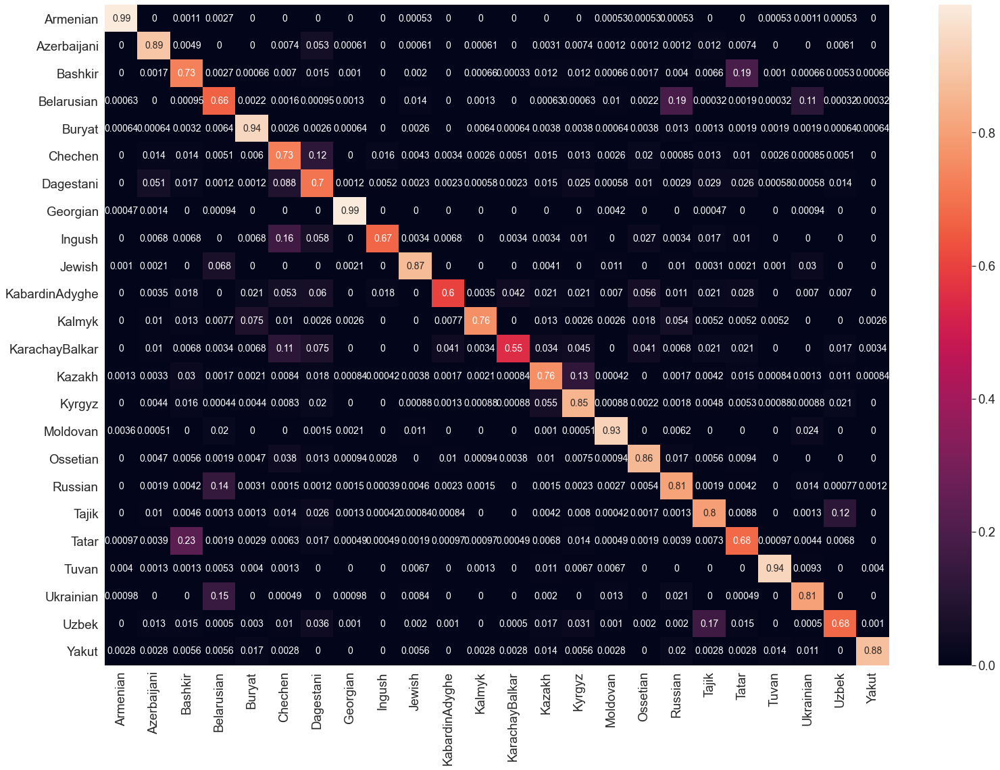

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9920	0.9878	0.9920	0.9899
Azerbaijani    	0.8926	0.8712	0.8926	0.8817
Bashkir        	0.7307	0.7509	0.7307	0.7406
Belarusian     	0.6638	0.7198	0.6638	0.6907
Buryat         	0.9397	0.9308	0.9397	0.9352
Chechen        	0.7284	0.6551	0.7284	0.6899
Dagestani      	0.7029	0.6654	0.7029	0.6837
Georgian       	0.9916	0.9846	0.9916	0.9881
Ingush         	0.6712	0.8305	0.6712	0.7424
Jewish         	0.8656	0.8525	0.8656	0.8590
KabardinAdyghe 	0.6021	0.7566	0.6021	0.6706
Kalmyk         	0.7629	0.8836	0.7629	0.8188
KarachayBalkar 	0.5514	0.8173	0.5514	0.6585
Kazakh         	0.7633	0.8441	0.7633	0.8017
Kyrgyz         	0.8501	0.7723	0.8501	0.8093
Moldovan       	0.9300	0.9407	0.9300	0.9353
Ossetian       	0.8630	0.8704	0.8630	0.8667
Russian        	0.8062	0.7299	0.8062	0.7662
Tajik          	0.7970	0.7874	0.7970	0.7922
Tatar          	0.6807	0.6351	0.6807	0.6571
Tuvan          	0.9373	0.9643	0.9373	0.9506
Ukrainian      	0.8052	0.7667	0.8052	0.7855


In [21]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['modified_huber'], 'penalty' : ['elasticnet'], 'alpha' : [0.000075, 0.0001, 0.0002],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.665, 0.675, 0.685],
                     'min_df': [1],
                     'lowercase': [False],
                 })

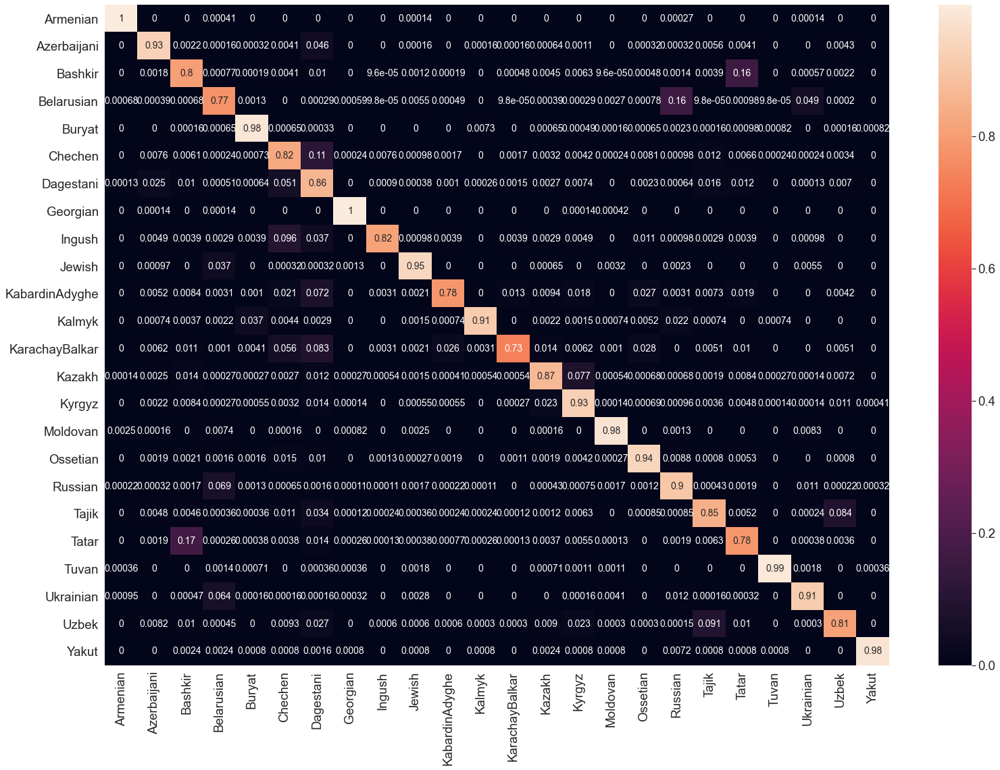

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9991	0.9955	0.9991	0.9973
Azerbaijani    	0.9304	0.9317	0.9304	0.9311
Bashkir        	0.8012	0.8226	0.8012	0.8117
Belarusian     	0.7746	0.8626	0.7746	0.8163
Buryat         	0.9837	0.9808	0.9837	0.9822
Chechen        	0.8240	0.7819	0.8240	0.8024
Dagestani      	0.8594	0.7833	0.8594	0.8196
Georgian       	0.9992	0.9962	0.9992	0.9977
Ingush         	0.8152	0.9298	0.8152	0.8688
Jewish         	0.9480	0.9462	0.9480	0.9471
KabardinAdyghe 	0.7835	0.9035	0.7835	0.8392
Kalmyk         	0.9138	0.9517	0.9138	0.9323
KarachayBalkar 	0.7346	0.9273	0.7346	0.8197
Kazakh         	0.8675	0.9397	0.8675	0.9021
Kyrgyz         	0.9251	0.8681	0.9251	0.8957
Moldovan       	0.9768	0.9834	0.9768	0.9801
Ossetian       	0.9413	0.9540	0.9413	0.9476
Russian        	0.9050	0.8168	0.9050	0.8587
Tajik          	0.8451	0.8777	0.8451	0.8611
Tatar          	0.7835	0.7426	0.7835	0.7625
Tuvan          	0.9900	0.9957	0.9900	0.9929
Ukrainian      	0.9147	0.8928	0.9147	0.9036


{'accuracy': 0.8858075406309751,
 'precision macro': 0.9049943057605301,
 'recall macro': 0.8875446785716727,
 'f1 macro': 0.8949976291263164}

In [22]:
test_model(svm, le, X_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  27 out of  27 | elapsed: 14.3min finished


{'model__alpha': 0.0001, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'modified_huber', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.6625, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


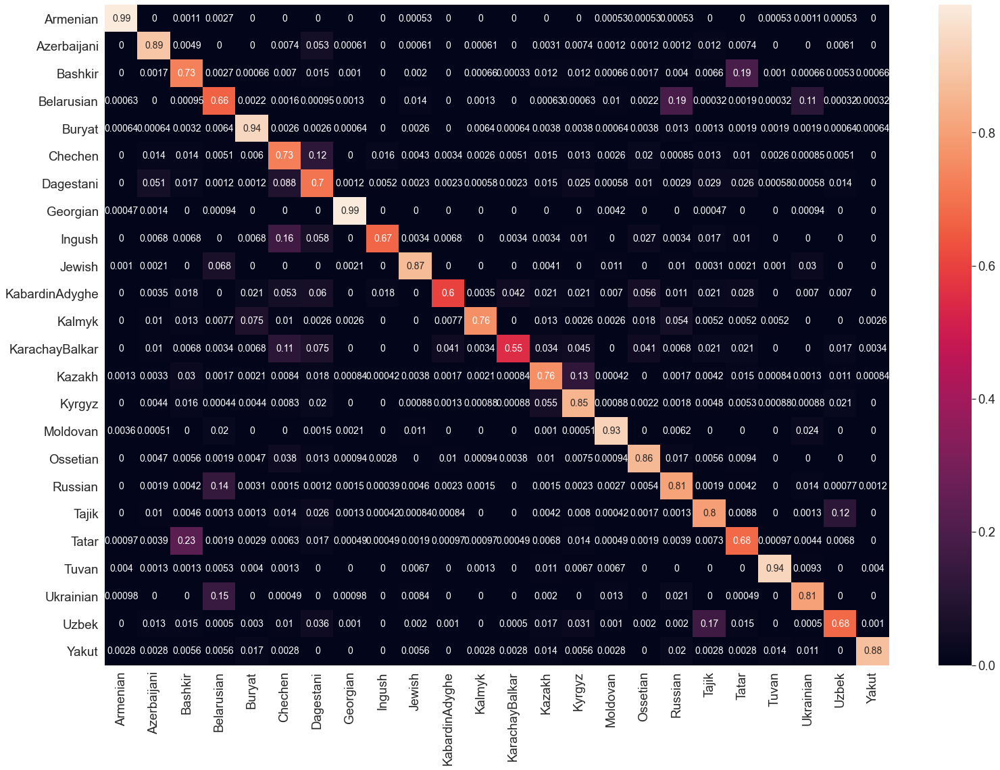

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9920	0.9878	0.9920	0.9899
Azerbaijani    	0.8926	0.8712	0.8926	0.8817
Bashkir        	0.7307	0.7509	0.7307	0.7406
Belarusian     	0.6638	0.7198	0.6638	0.6907
Buryat         	0.9397	0.9308	0.9397	0.9352
Chechen        	0.7284	0.6551	0.7284	0.6899
Dagestani      	0.7029	0.6654	0.7029	0.6837
Georgian       	0.9916	0.9846	0.9916	0.9881
Ingush         	0.6712	0.8305	0.6712	0.7424
Jewish         	0.8656	0.8525	0.8656	0.8590
KabardinAdyghe 	0.6021	0.7566	0.6021	0.6706
Kalmyk         	0.7629	0.8836	0.7629	0.8188
KarachayBalkar 	0.5514	0.8173	0.5514	0.6585
Kazakh         	0.7633	0.8441	0.7633	0.8017
Kyrgyz         	0.8501	0.7723	0.8501	0.8093
Moldovan       	0.9300	0.9407	0.9300	0.9353
Ossetian       	0.8630	0.8704	0.8630	0.8667
Russian        	0.8062	0.7299	0.8062	0.7662
Tajik          	0.7970	0.7874	0.7970	0.7922
Tatar          	0.6807	0.6351	0.6807	0.6571
Tuvan          	0.9373	0.9643	0.9373	0.9506
Ukrainian      	0.8052	0.7667	0.8052	0.7855


In [23]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['modified_huber'], 'penalty' : ['elasticnet'], 'alpha' : [0.000085, 0.0001, 0.000115],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.6625, 0.665, 0.6675],
                     'min_df': [1],
                     'lowercase': [False],
                 })

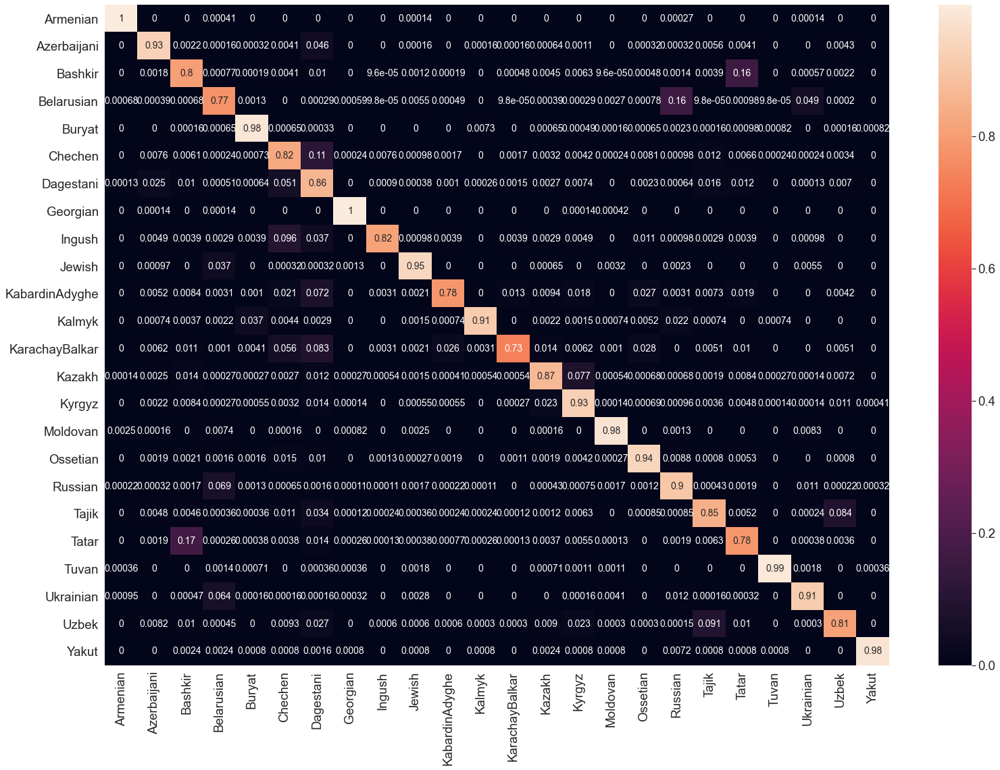

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9991	0.9955	0.9991	0.9973
Azerbaijani    	0.9304	0.9317	0.9304	0.9311
Bashkir        	0.8012	0.8226	0.8012	0.8117
Belarusian     	0.7746	0.8626	0.7746	0.8163
Buryat         	0.9837	0.9808	0.9837	0.9822
Chechen        	0.8240	0.7819	0.8240	0.8024
Dagestani      	0.8594	0.7833	0.8594	0.8196
Georgian       	0.9992	0.9962	0.9992	0.9977
Ingush         	0.8152	0.9298	0.8152	0.8688
Jewish         	0.9480	0.9462	0.9480	0.9471
KabardinAdyghe 	0.7835	0.9035	0.7835	0.8392
Kalmyk         	0.9138	0.9517	0.9138	0.9323
KarachayBalkar 	0.7346	0.9273	0.7346	0.8197
Kazakh         	0.8675	0.9397	0.8675	0.9021
Kyrgyz         	0.9251	0.8681	0.9251	0.8957
Moldovan       	0.9768	0.9834	0.9768	0.9801
Ossetian       	0.9413	0.9540	0.9413	0.9476
Russian        	0.9050	0.8168	0.9050	0.8587
Tajik          	0.8451	0.8777	0.8451	0.8611
Tatar          	0.7835	0.7426	0.7835	0.7625
Tuvan          	0.9900	0.9957	0.9900	0.9929
Ukrainian      	0.9147	0.8928	0.9147	0.9036


{'accuracy': 0.8858075406309751,
 'precision macro': 0.9049943057605301,
 'recall macro': 0.8875446785716727,
 'f1 macro': 0.8949976291263164}

In [24]:
test_model(svm, le, X_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  27 out of  27 | elapsed:  5.4min finished


{'model__alpha': 8.5e-05, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'modified_huber', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.66, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


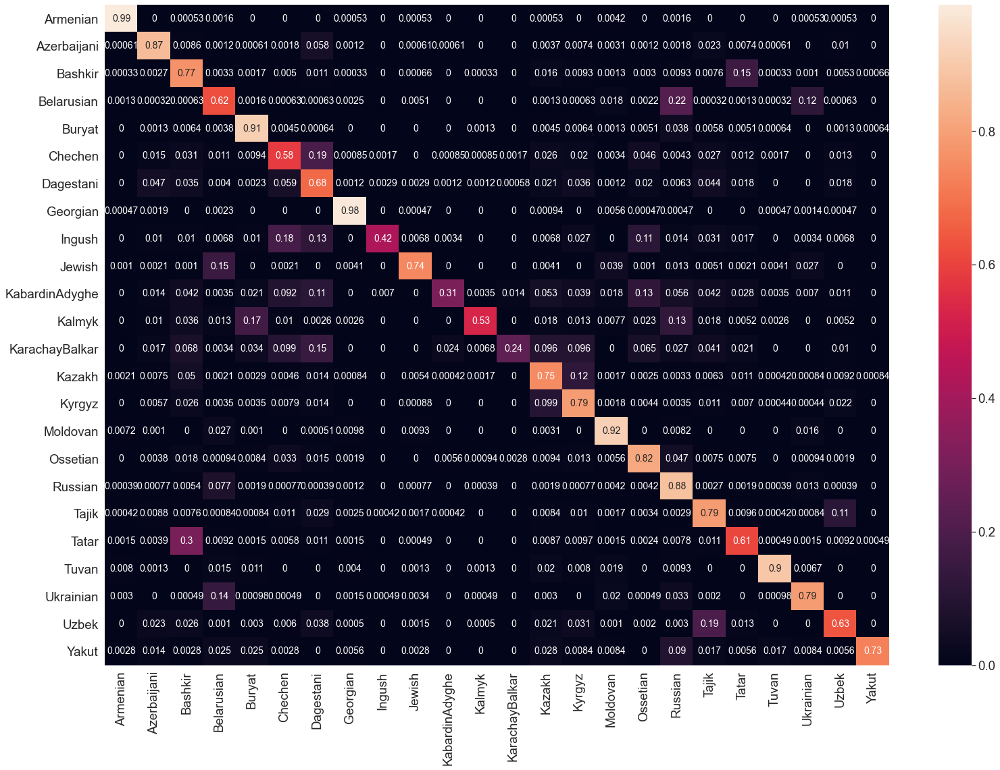

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9894	0.9764	0.9894	0.9829
Azerbaijani    	0.8680	0.8482	0.8680	0.8580
Bashkir        	0.7662	0.6797	0.7662	0.7204
Belarusian     	0.6240	0.7130	0.6240	0.6655
Buryat         	0.9128	0.8917	0.9128	0.9021
Chechen        	0.5841	0.6527	0.5841	0.6165
Dagestani      	0.6770	0.6212	0.6770	0.6479
Georgian       	0.9850	0.9704	0.9850	0.9777
Ingush         	0.4247	0.9185	0.4247	0.5808
Jewish         	0.7426	0.9005	0.7426	0.8139
KabardinAdyghe 	0.3099	0.8148	0.3099	0.4490
Kalmyk         	0.5309	0.9196	0.5309	0.6732
KarachayBalkar 	0.2432	0.8765	0.2432	0.3807
Kazakh         	0.7503	0.7654	0.7503	0.7578
Kyrgyz         	0.7888	0.7457	0.7888	0.7666
Moldovan       	0.9166	0.8843	0.9166	0.9002
Ossetian       	0.8171	0.7715	0.8171	0.7936
Russian        	0.8809	0.6726	0.8809	0.7628
Tajik          	0.7903	0.7288	0.7903	0.7583
Tatar          	0.6084	0.6535	0.6084	0.6302
Tuvan          	0.8960	0.9628	0.8960	0.9282
Ukrainian      	0.7900	0.7633	0.7900	0.7764


In [35]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['modified_huber'], 'penalty' : ['elasticnet'], 'alpha' : [0.000085, 0.0001, 0.000115],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='tfidf', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.66, 0.665, 0.67],
                     'min_df': [1],
                     'lowercase': [False],
                 })

Fitting 3 folds for each of 15 candidates, totalling 45 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:  6.5min
[Parallel(n_jobs=6)]: Done  45 out of  45 | elapsed: 11.2min finished


{'model__alpha': 1e-05, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'modified_huber', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.45, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


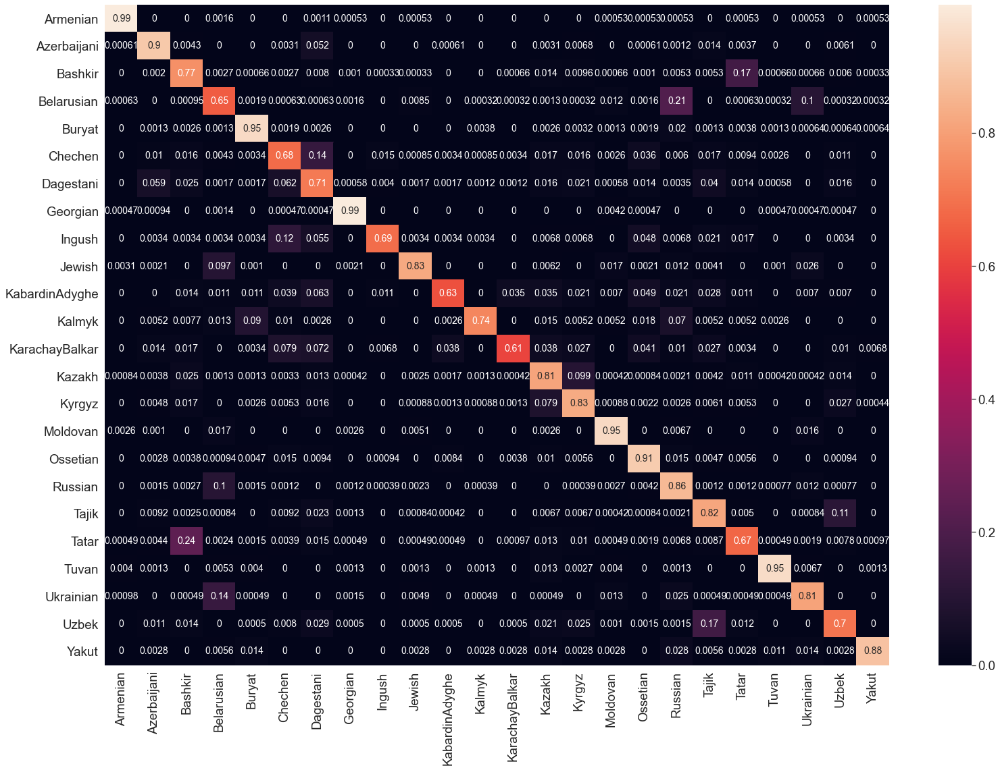

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9931	0.9894	0.9931	0.9913
Azerbaijani    	0.9036	0.8710	0.9036	0.8870
Bashkir        	0.7655	0.7580	0.7655	0.7617
Belarusian     	0.6547	0.7379	0.6547	0.6938
Buryat         	0.9494	0.9445	0.9494	0.9469
Chechen        	0.6840	0.7369	0.6840	0.7095
Dagestani      	0.7145	0.6883	0.7145	0.7011
Georgian       	0.9902	0.9860	0.9902	0.9881
Ingush         	0.6884	0.8590	0.6884	0.7643
Jewish         	0.8256	0.9158	0.8256	0.8684
KabardinAdyghe 	0.6303	0.8174	0.6303	0.7117
Kalmyk         	0.7423	0.9351	0.7423	0.8276
KarachayBalkar 	0.6062	0.8510	0.6062	0.7080
Kazakh         	0.8130	0.8168	0.8130	0.8149
Kyrgyz         	0.8265	0.8060	0.8265	0.8161
Moldovan       	0.9454	0.9382	0.9454	0.9418
Ossetian       	0.9081	0.8604	0.9081	0.8836
Russian        	0.8636	0.7130	0.8636	0.7811
Tajik          	0.8184	0.7801	0.8184	0.7988
Tatar          	0.6744	0.6757	0.6744	0.6751
Tuvan          	0.9520	0.9714	0.9520	0.9616
Ukrainian      	0.8072	0.7889	0.8072	0.7980


In [5]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['modified_huber'], 'penalty' : ['elasticnet'], 'alpha' : [0.000005, 0.00001, 0.00005],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='tfidf', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.45, 0.5, 0.55, 0.6, 0.65],
                     'min_df': [1],
                     'lowercase': [False],
                 })

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  14 out of  18 | elapsed:  4.4min remaining:  1.3min
[Parallel(n_jobs=6)]: Done  18 out of  18 | elapsed:  4.4min finished


{'model__alpha': 1e-05, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'modified_huber', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.45, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


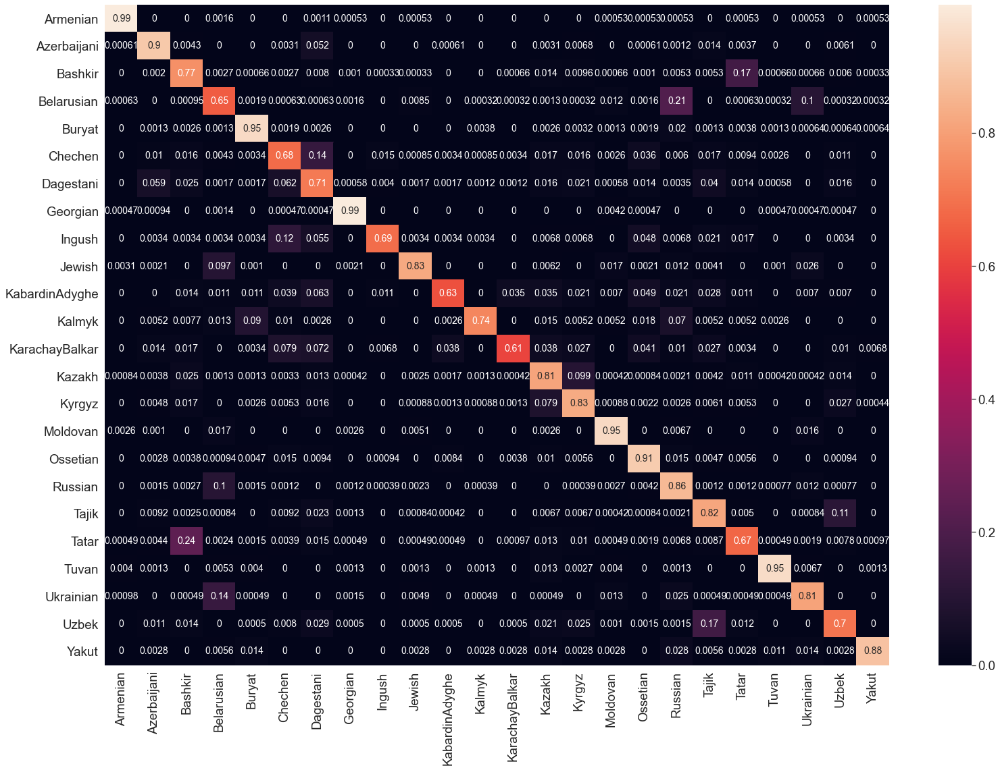

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9931	0.9894	0.9931	0.9913
Azerbaijani    	0.9036	0.8710	0.9036	0.8870
Bashkir        	0.7655	0.7580	0.7655	0.7617
Belarusian     	0.6547	0.7379	0.6547	0.6938
Buryat         	0.9494	0.9445	0.9494	0.9469
Chechen        	0.6840	0.7369	0.6840	0.7095
Dagestani      	0.7145	0.6883	0.7145	0.7011
Georgian       	0.9902	0.9860	0.9902	0.9881
Ingush         	0.6884	0.8590	0.6884	0.7643
Jewish         	0.8256	0.9158	0.8256	0.8684
KabardinAdyghe 	0.6303	0.8174	0.6303	0.7117
Kalmyk         	0.7423	0.9351	0.7423	0.8276
KarachayBalkar 	0.6062	0.8510	0.6062	0.7080
Kazakh         	0.8130	0.8168	0.8130	0.8149
Kyrgyz         	0.8265	0.8060	0.8265	0.8161
Moldovan       	0.9454	0.9382	0.9454	0.9418
Ossetian       	0.9081	0.8604	0.9081	0.8836
Russian        	0.8636	0.7130	0.8636	0.7811
Tajik          	0.8184	0.7801	0.8184	0.7988
Tatar          	0.6744	0.6757	0.6744	0.6751
Tuvan          	0.9520	0.9714	0.9520	0.9616
Ukrainian      	0.8072	0.7889	0.8072	0.7980


In [6]:
svm = proc_model(SGDClassifier(),
                 {'loss' : ['modified_huber'], 'penalty' : ['elasticnet'], 'alpha' : [0.00001],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='tfidf', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.35, 0.375, 0.4, 0.425, 0.45, 0.475],
                     'min_df': [1],
                     'lowercase': [False],
                 })

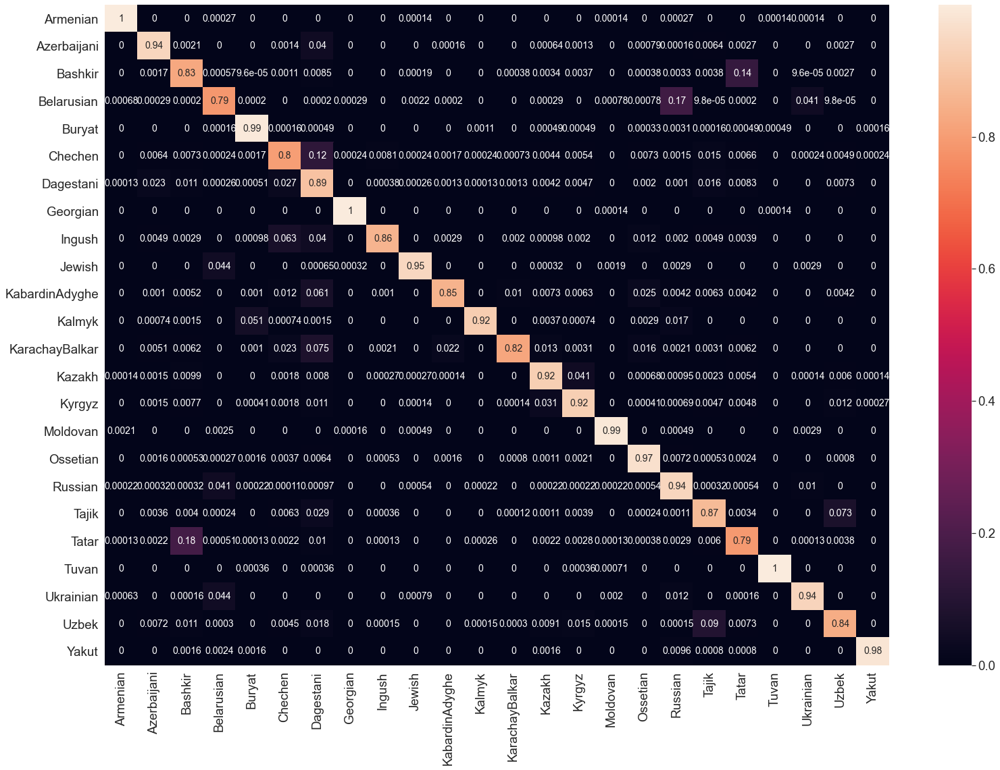

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9989	0.9961	0.9989	0.9975
Azerbaijani    	0.9422	0.9417	0.9422	0.9419
Bashkir        	0.8270	0.8303	0.8270	0.8286
Belarusian     	0.7873	0.9059	0.7873	0.8424
Buryat         	0.9923	0.9837	0.9923	0.9880
Chechen        	0.8032	0.8743	0.8032	0.8372
Dagestani      	0.8906	0.8096	0.8906	0.8482
Georgian       	0.9997	0.9992	0.9997	0.9994
Ingush         	0.8583	0.9482	0.8583	0.9010
Jewish         	0.9464	0.9851	0.9464	0.9654
KabardinAdyghe 	0.8515	0.9410	0.8515	0.8940
Kalmyk         	0.9204	0.9889	0.9204	0.9534
KarachayBalkar 	0.8220	0.9569	0.8220	0.8843
Kazakh         	0.9217	0.9382	0.9217	0.9299
Kyrgyz         	0.9237	0.9199	0.9237	0.9218
Moldovan       	0.9913	0.9943	0.9913	0.9928
Ossetian       	0.9689	0.9633	0.9689	0.9661
Russian        	0.9437	0.8167	0.9437	0.8756
Tajik          	0.8742	0.8793	0.8742	0.8768
Tatar          	0.7894	0.7748	0.7894	0.7820
Tuvan          	0.9982	0.9982	0.9982	0.9982
Ukrainian      	0.9409	0.9169	0.9409	0.9287


{'accuracy': 0.9043902366156787,
 'precision macro': 0.9258858085797484,
 'recall macro': 0.908737090888509,
 'f1 macro': 0.9163121694459755}

In [7]:
test_model(svm, le, X_train, y_train)

## Linear Regression

Fitting 3 folds for each of 54 candidates, totalling 162 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:  5.4min
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed: 24.3min
[Parallel(n_jobs=6)]: Done 162 out of 162 | elapsed: 32.2min finished


{'model__alpha': 2.5e-05, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'log', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.7, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


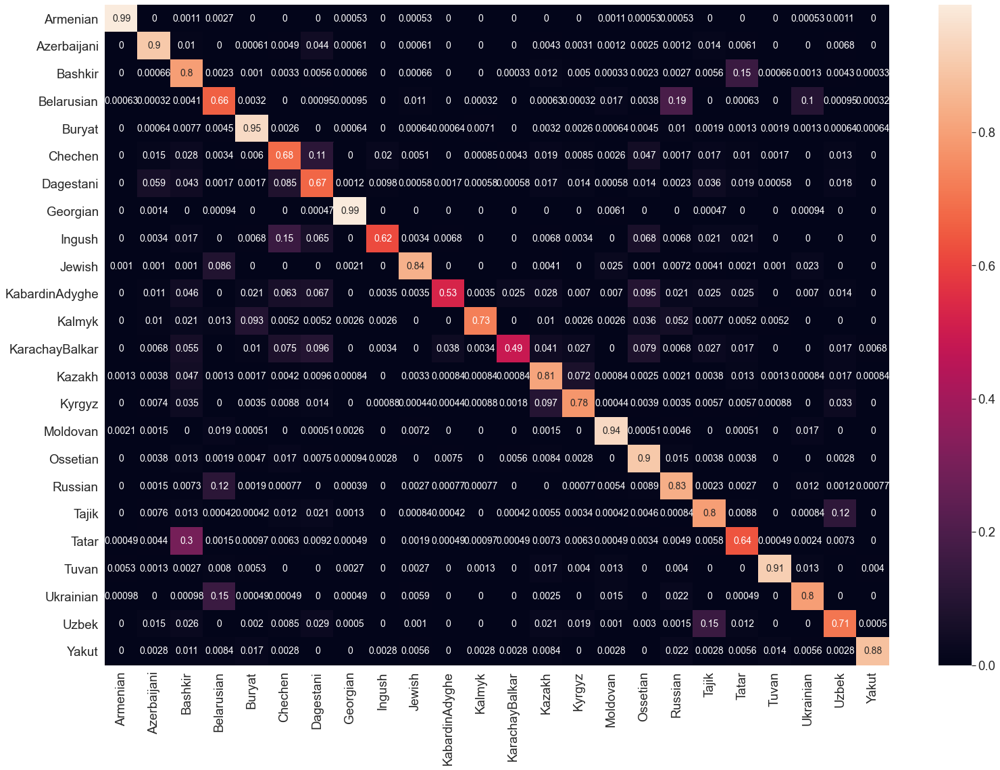

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9915	0.9910	0.9915	0.9912
Azerbaijani    	0.8999	0.8629	0.8999	0.8810
Bashkir        	0.7977	0.6818	0.7977	0.7352
Belarusian     	0.6622	0.7275	0.6622	0.6934
Buryat         	0.9468	0.9295	0.9468	0.9381
Chechen        	0.6840	0.6852	0.6840	0.6846
Dagestani      	0.6724	0.7070	0.6724	0.6893
Georgian       	0.9897	0.9860	0.9897	0.9878
Ingush         	0.6164	0.7860	0.6164	0.6910
Jewish         	0.8421	0.8885	0.8421	0.8647
KabardinAdyghe 	0.5282	0.8242	0.5282	0.6438
Kalmyk         	0.7268	0.9156	0.7268	0.8103
KarachayBalkar 	0.4897	0.8314	0.4897	0.6164
Kazakh         	0.8101	0.8091	0.8101	0.8096
Kyrgyz         	0.7765	0.8511	0.7765	0.8121
Moldovan       	0.9418	0.9168	0.9418	0.9292
Ossetian       	0.8987	0.7872	0.8987	0.8392
Russian        	0.8347	0.7337	0.8347	0.7810
Tajik          	0.7961	0.7889	0.7961	0.7925
Tatar          	0.6390	0.6702	0.6390	0.6542
Tuvan          	0.9147	0.9689	0.9147	0.9410
Ukrainian      	0.7973	0.7880	0.7973	0.7927


In [6]:
lr = proc_model(SGDClassifier(),
                 {'loss' : ['log'], 'penalty' : ['elasticnet'], 'alpha' : [0.000025, 0.00005, 0.0001],
                  'early_stopping' : [False], 'class_weight': [None, 'balanced'], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.6, 0.7, 0.8],
                     'min_df': [1, 5, 0.1],
                     'lowercase': [False],
                 })

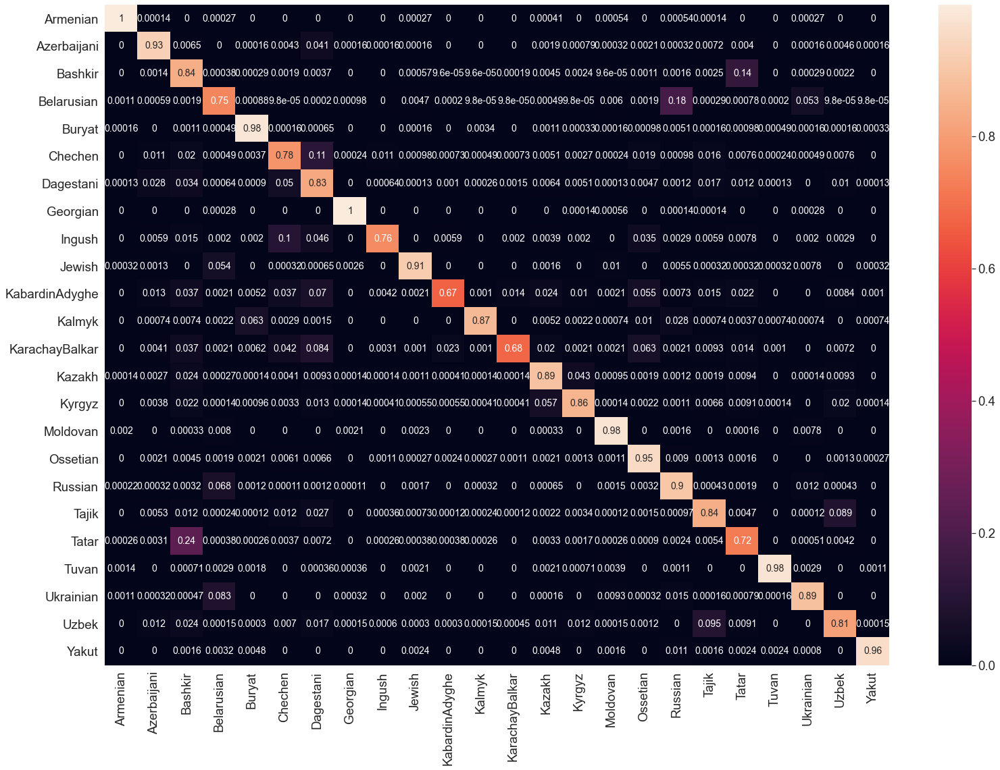

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9974	0.9943	0.9974	0.9959
Azerbaijani    	0.9256	0.9180	0.9256	0.9218
Bashkir        	0.8408	0.7425	0.8408	0.7886
Belarusian     	0.7455	0.8424	0.7455	0.7910
Buryat         	0.9839	0.9715	0.9839	0.9776
Chechen        	0.7797	0.7847	0.7797	0.7822
Dagestani      	0.8262	0.8060	0.8262	0.8159
Georgian       	0.9985	0.9944	0.9985	0.9965
Ingush         	0.7595	0.9141	0.7595	0.8297
Jewish         	0.9146	0.9520	0.9146	0.9329
KabardinAdyghe 	0.6705	0.9092	0.6705	0.7718
Kalmyk         	0.8688	0.9656	0.8688	0.9147
KarachayBalkar 	0.6759	0.9359	0.6759	0.7849
Kazakh         	0.8901	0.8950	0.8901	0.8925
Kyrgyz         	0.8572	0.9198	0.8572	0.8874
Moldovan       	0.9753	0.9655	0.9753	0.9704
Ossetian       	0.9536	0.8965	0.9536	0.9241
Russian        	0.9034	0.7930	0.9034	0.8446
Tajik          	0.8396	0.8676	0.8396	0.8534
Tatar          	0.7234	0.7477	0.7234	0.7353
Tuvan          	0.9786	0.9946	0.9786	0.9865
Ukrainian      	0.8868	0.8821	0.8868	0.8845


{'accuracy': 0.8723634679732314,
 'precision macro': 0.8959755453024991,
 'recall macro': 0.8653249116950397,
 'f1 macro': 0.8780841230993529}

In [7]:
test_model(lr, le, X_train, y_train)

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:  9.0min
[Parallel(n_jobs=6)]: Done  54 out of  54 | elapsed: 18.1min finished


{'model__alpha': 2.5e-05, 'model__class_weight': None, 'model__early_stopping': False, 'model__loss': 'log', 'model__penalty': 'elasticnet', 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.65, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


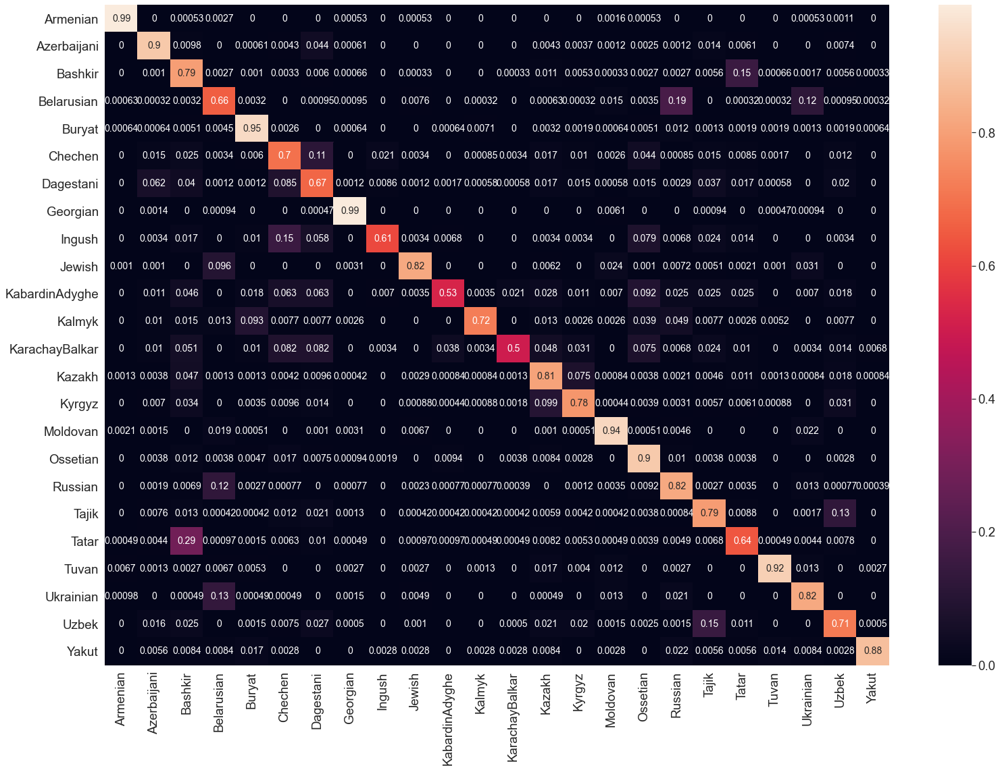

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9920	0.9899	0.9920	0.9910
Azerbaijani    	0.9012	0.8575	0.9012	0.8788
Bashkir        	0.7948	0.6898	0.7948	0.7386
Belarusian     	0.6553	0.7277	0.6553	0.6896
Buryat         	0.9462	0.9295	0.9462	0.9377
Chechen        	0.6960	0.6889	0.6960	0.6924
Dagestani      	0.6724	0.7087	0.6724	0.6901
Georgian       	0.9887	0.9841	0.9887	0.9864
Ingush         	0.6130	0.7956	0.6130	0.6925
Jewish         	0.8215	0.9092	0.8215	0.8631
KabardinAdyghe 	0.5282	0.8108	0.5282	0.6397
Kalmyk         	0.7216	0.9150	0.7216	0.8069
KarachayBalkar 	0.5000	0.8391	0.5000	0.6266
Kazakh         	0.8072	0.8082	0.8072	0.8077
Kyrgyz         	0.7778	0.8440	0.7778	0.8096
Moldovan       	0.9382	0.9230	0.9382	0.9306
Ossetian       	0.9034	0.7868	0.9034	0.8410
Russian        	0.8235	0.7366	0.8235	0.7777
Tajik          	0.7915	0.7892	0.7915	0.7904
Tatar          	0.6414	0.6762	0.6414	0.6584
Tuvan          	0.9187	0.9663	0.9187	0.9419
Ukrainian      	0.8229	0.7615	0.8229	0.7910


In [9]:
lr = proc_model(SGDClassifier(),
                 {'loss' : ['log'], 'penalty' : ['elasticnet'], 'alpha' : [0.000005, 0.00001, 0.000025],
                  'early_stopping' : [False], 'class_weight': [None], 'random_state': [0]},
                 le, X_train, y_train, X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.65, 0.7, 0.75],
                     'min_df': [1, 0.01],
                     'lowercase': [False],
                 })

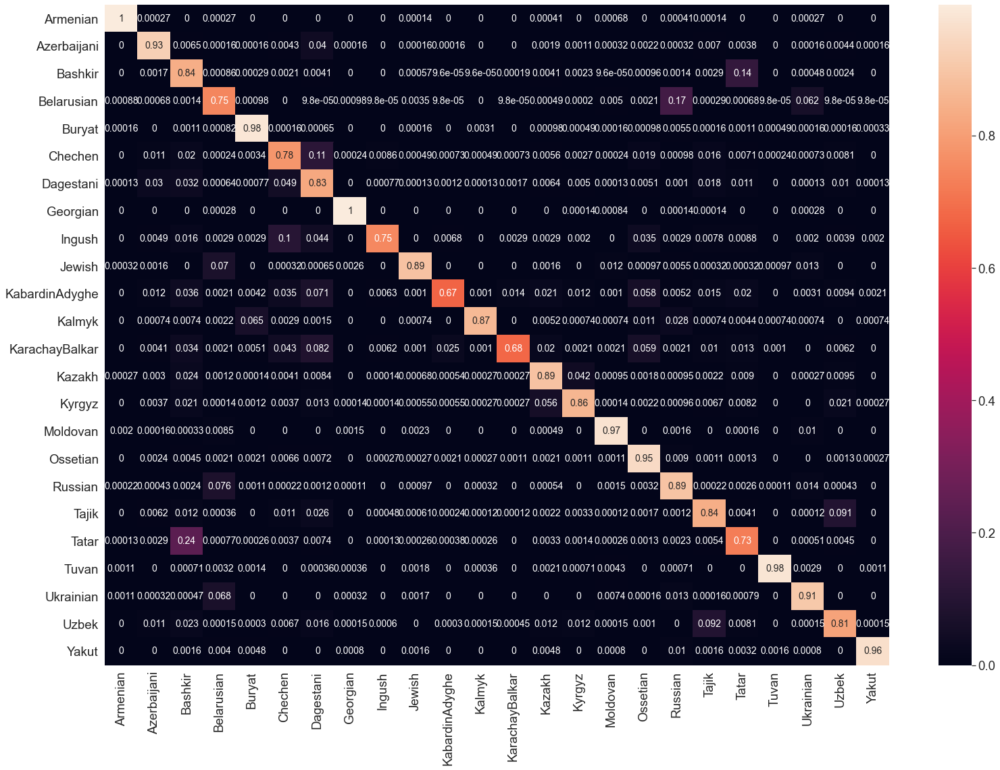

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9974	0.9947	0.9974	0.9961
Azerbaijani    	0.9269	0.9144	0.9269	0.9206
Bashkir        	0.8403	0.7481	0.8403	0.7915
Belarusian     	0.7473	0.8370	0.7473	0.7896
Buryat         	0.9832	0.9716	0.9832	0.9774
Chechen        	0.7807	0.7859	0.7807	0.7833
Dagestani      	0.8262	0.8075	0.8262	0.8167
Georgian       	0.9982	0.9950	0.9982	0.9966
Ingush         	0.7488	0.9207	0.7488	0.8259
Jewish         	0.8892	0.9617	0.8892	0.9241
KabardinAdyghe 	0.6736	0.9032	0.6736	0.7717
Kalmyk         	0.8666	0.9687	0.8666	0.9148
KarachayBalkar 	0.6811	0.9337	0.6811	0.7876
Kazakh         	0.8904	0.8965	0.8904	0.8934
Kyrgyz         	0.8601	0.9208	0.8601	0.8894
Moldovan       	0.9730	0.9678	0.9730	0.9704
Ossetian       	0.9538	0.8943	0.9538	0.9231
Russian        	0.8944	0.7993	0.8944	0.8442
Tajik          	0.8383	0.8677	0.8383	0.8528
Tatar          	0.7288	0.7527	0.7288	0.7405
Tuvan          	0.9790	0.9953	0.9790	0.9871
Ukrainian      	0.9057	0.8641	0.9057	0.8844


{'accuracy': 0.8727294455066922,
 'precision macro': 0.8960944781104709,
 'recall macro': 0.8650729283480656,
 'f1 macro': 0.878049491546026}

In [10]:
test_model(lr, le, X_train, y_train)

## Random Forest

Fitting 3 folds for each of 12 candidates, totalling 36 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:  7.8min
[Parallel(n_jobs=6)]: Done  36 out of  36 | elapsed: 11.9min finished


{'model__n_estimators': 50, 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.65, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


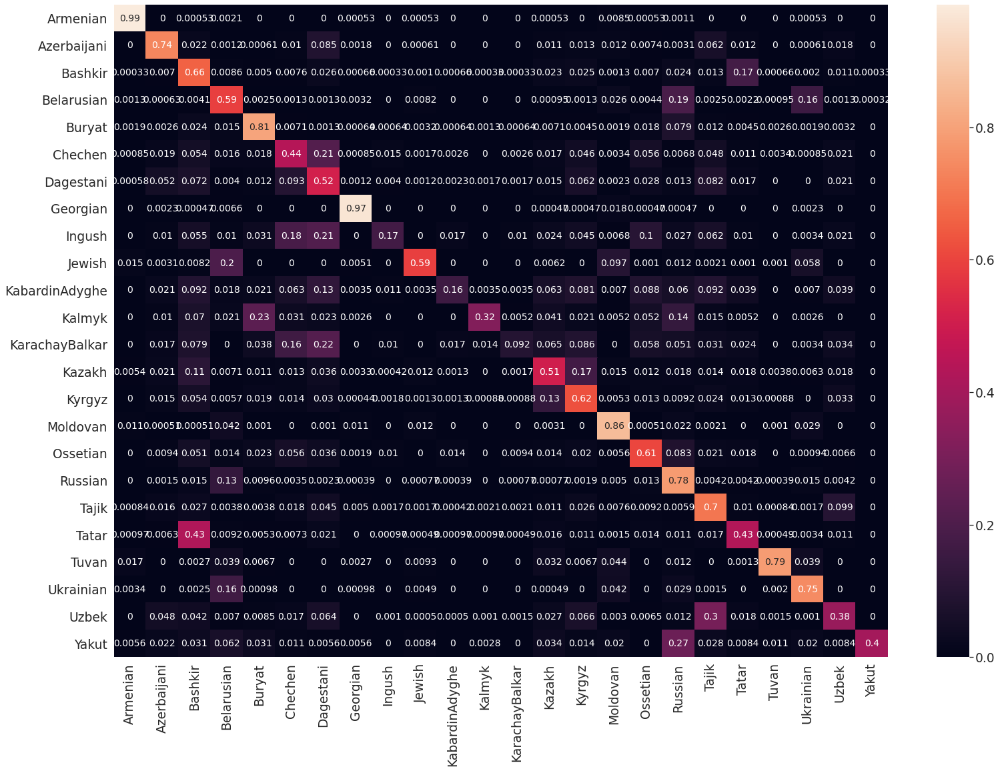

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9851	0.9562	0.9851	0.9705
Azerbaijani    	0.7385	0.7403	0.7385	0.7394
Bashkir        	0.6616	0.5116	0.6616	0.5770
Belarusian     	0.5902	0.6091	0.5902	0.5995
Buryat         	0.8064	0.7785	0.8064	0.7922
Chechen        	0.4406	0.4734	0.4406	0.4564
Dagestani      	0.5153	0.4439	0.5153	0.4770
Georgian       	0.9686	0.9636	0.9686	0.9661
Ingush         	0.1712	0.4673	0.1712	0.2506
Jewish         	0.5918	0.8231	0.5918	0.6885
KabardinAdyghe 	0.1585	0.4945	0.1585	0.2400
Kalmyk         	0.3247	0.8456	0.3247	0.4693
KarachayBalkar 	0.0925	0.3971	0.0925	0.1500
Kazakh         	0.5056	0.6363	0.5056	0.5635
Kyrgyz         	0.6240	0.5884	0.6240	0.6057
Moldovan       	0.8636	0.7729	0.8636	0.8158
Ossetian       	0.6069	0.5947	0.6069	0.6007
Russian        	0.7846	0.5992	0.7846	0.6795
Tajik          	0.7009	0.5820	0.7009	0.6360
Tatar          	0.4338	0.5302	0.4338	0.4772
Tuvan          	0.7880	0.9336	0.7880	0.8547
Ukrainian      	0.7482	0.6736	0.7482	0.7089


In [ ]:
rf = proc_model(RandomForestClassifier(),
                 {'random_state': [0], 'n_estimators': [50]},
                 le, X_train[:20000], y_train[:20000], X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.65, 0.7, 0.75],
                     'min_df': [1, 5, 10, 0.1],
                     'lowercase': [False],
                 })

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  27 out of  27 | elapsed: 19.3min finished


{'model__n_estimators': 100, 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.5, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


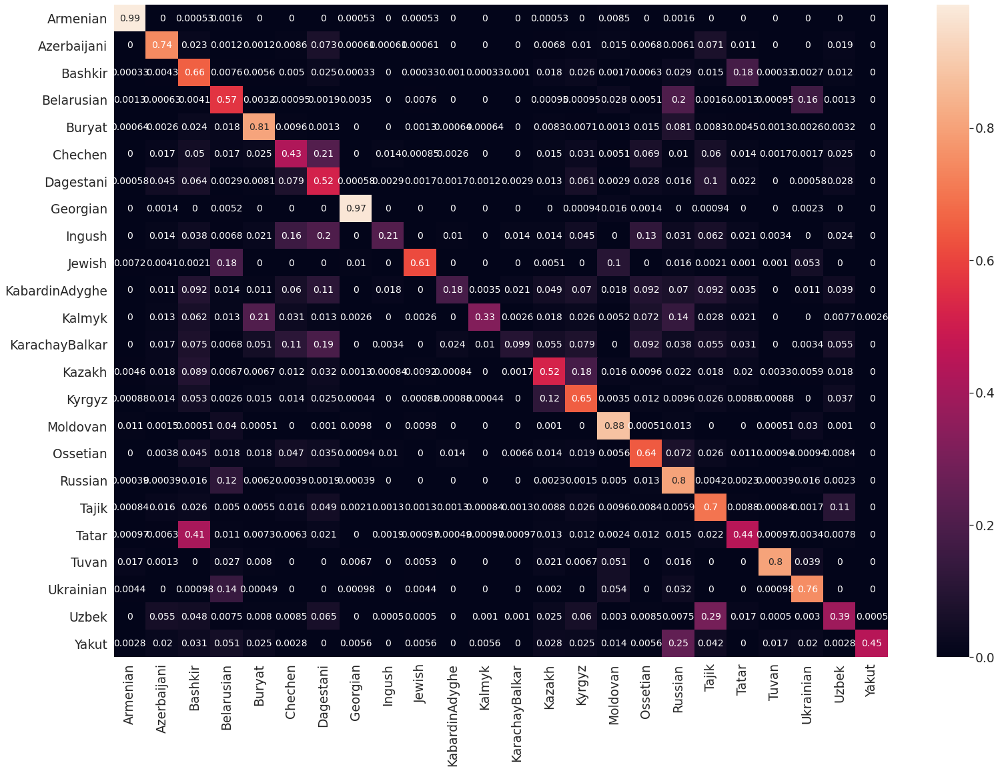

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9862	0.9607	0.9862	0.9733
Azerbaijani    	0.7446	0.7553	0.7446	0.7499
Bashkir        	0.6579	0.5267	0.6579	0.5851
Belarusian     	0.5697	0.6226	0.5697	0.5950
Buryat         	0.8090	0.7957	0.8090	0.8023
Chechen        	0.4287	0.5112	0.4287	0.4663
Dagestani      	0.5187	0.4571	0.5187	0.4860
Georgian       	0.9714	0.9696	0.9714	0.9705
Ingush         	0.2123	0.5586	0.2123	0.3077
Jewish         	0.6133	0.8592	0.6133	0.7157
KabardinAdyghe 	0.1831	0.5474	0.1831	0.2744
Kalmyk         	0.3273	0.8819	0.3273	0.4774
KarachayBalkar 	0.0993	0.4394	0.0993	0.1620
Kazakh         	0.5215	0.6777	0.5215	0.5895
Kyrgyz         	0.6543	0.5979	0.6543	0.6248
Moldovan       	0.8806	0.7598	0.8806	0.8157
Ossetian       	0.6435	0.5950	0.6435	0.6183
Russian        	0.8039	0.5945	0.8039	0.6835
Tajik          	0.6992	0.5637	0.6992	0.6242
Tatar          	0.4449	0.5334	0.4449	0.4852
Tuvan          	0.8013	0.9435	0.8013	0.8666
Ukrainian      	0.7550	0.6671	0.7550	0.7084


In [ ]:
rf = proc_model(RandomForestClassifier(),
                 {'random_state': [0], 'n_estimators': [100]},
                 le, X_train[:20000], y_train[:20000], X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.5, 0.575, 0.65],
                     'min_df': [1, 5, 0.1],
                     'lowercase': [False],
                 })

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  14 out of  18 | elapsed: 32.5min remaining:  9.3min
[Parallel(n_jobs=6)]: Done  18 out of  18 | elapsed: 42.8min finished


{'model__n_estimators': 300, 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.3, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


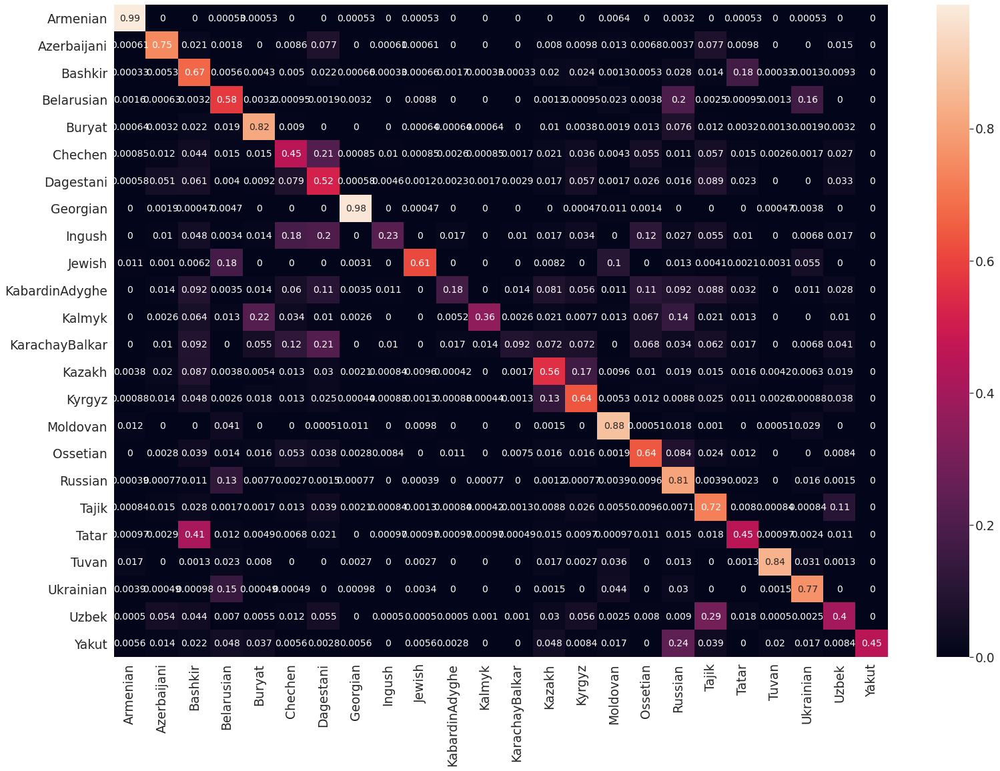

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9873	0.9568	0.9873	0.9718
Azerbaijani    	0.7471	0.7606	0.7471	0.7538
Bashkir        	0.6745	0.5386	0.6745	0.5989
Belarusian     	0.5795	0.6294	0.5795	0.6034
Buryat         	0.8179	0.8091	0.8179	0.8135
Chechen        	0.4535	0.5160	0.4535	0.4827
Dagestani      	0.5187	0.4690	0.5187	0.4926
Georgian       	0.9751	0.9706	0.9751	0.9729
Ingush         	0.2260	0.5893	0.2260	0.3267
Jewish         	0.6123	0.8565	0.6123	0.7141
KabardinAdyghe 	0.1761	0.5208	0.1761	0.2632
Kalmyk         	0.3557	0.8846	0.3557	0.5074
KarachayBalkar 	0.0925	0.4219	0.0925	0.1517
Kazakh         	0.5554	0.6600	0.5554	0.6032
Kyrgyz         	0.6376	0.6147	0.6376	0.6259
Moldovan       	0.8755	0.7945	0.8755	0.8330
Ossetian       	0.6435	0.6186	0.6435	0.6308
Russian        	0.8069	0.5983	0.8069	0.6871
Tajik          	0.7236	0.5791	0.7236	0.6433
Tatar          	0.4512	0.5461	0.4512	0.4942
Tuvan          	0.8427	0.9322	0.8427	0.8852
Ukrainian      	0.7668	0.6731	0.7668	0.7169


In [ ]:
rf = proc_model(RandomForestClassifier(),
                 {'random_state': [0], 'n_estimators': [300]},
                 le, X_train[:20000], y_train[:20000], X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.3, 0.4, 0.5],
                     'min_df': [1, 0.1],
                     'lowercase': [False],
                 })

Fitting 2 folds for each of 6 candidates, totalling 12 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 out of  12 | elapsed:  5.9min remaining:  5.9min
[Parallel(n_jobs=6)]: Done  12 out of  12 | elapsed:  8.5min finished


{'model__n_estimators': 300, 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.1, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


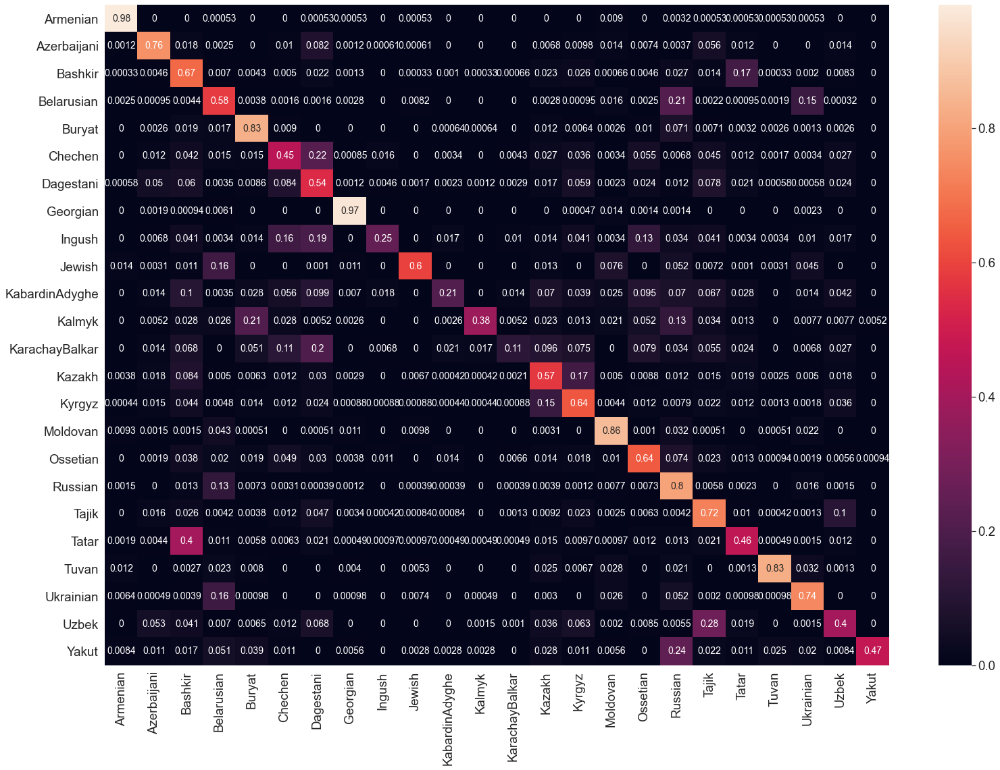

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9836	0.9552	0.9836	0.9692
Azerbaijani    	0.7594	0.7645	0.7594	0.7619
Bashkir        	0.6729	0.5476	0.6729	0.6038
Belarusian     	0.5820	0.6221	0.5820	0.6014
Buryat         	0.8321	0.8082	0.8321	0.8200
Chechen        	0.4518	0.5181	0.4518	0.4827
Dagestani      	0.5412	0.4695	0.5412	0.5028
Georgian       	0.9719	0.9597	0.9719	0.9657
Ingush         	0.2534	0.5873	0.2534	0.3541
Jewish         	0.5969	0.8609	0.5969	0.7050
KabardinAdyghe 	0.2077	0.5619	0.2077	0.3033
Kalmyk         	0.3840	0.8976	0.3840	0.5379
KarachayBalkar 	0.1130	0.4400	0.1130	0.1798
Kazakh         	0.5726	0.6409	0.5726	0.6048
Kyrgyz         	0.6363	0.6060	0.6363	0.6208
Moldovan       	0.8636	0.8217	0.8636	0.8422
Ossetian       	0.6445	0.6361	0.6445	0.6403
Russian        	0.7992	0.5814	0.7992	0.6732
Tajik          	0.7223	0.5998	0.7223	0.6554
Tatar          	0.4639	0.5475	0.4639	0.5022
Tuvan          	0.8293	0.9353	0.8293	0.8792
Ukrainian      	0.7383	0.6835	0.7383	0.7099


In [6]:
rf = proc_model(RandomForestClassifier(),
                 {'random_state': [0], 'n_estimators': [300]},
                 le, X_train[:20000], y_train[:20000], X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.1, 0.2, 0.3],
                     'min_df': [1, 10],
                     'lowercase': [False],
                 }, cv=2)

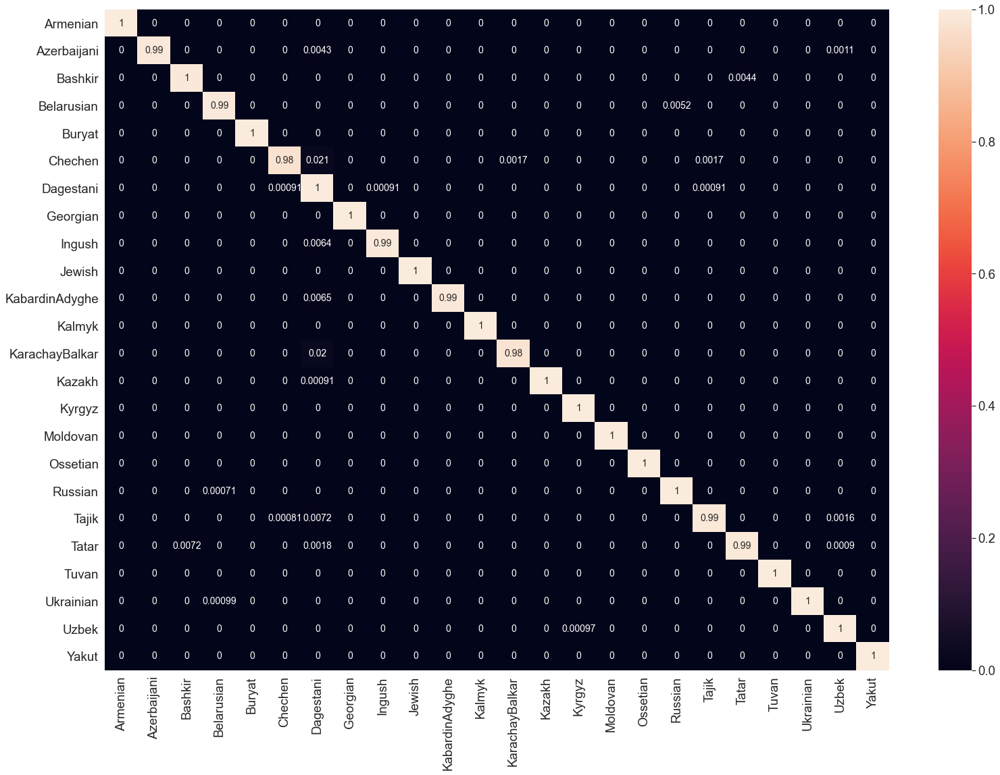

Ethnos          Acc	Prec	Rec	F1
Armenian       	1.0000	1.0000	1.0000	1.0000
Azerbaijani    	0.9946	1.0000	0.9946	0.9973
Bashkir        	0.9956	0.9949	0.9956	0.9953
Belarusian     	0.9948	0.9987	0.9948	0.9968
Buryat         	1.0000	1.0000	1.0000	1.0000
Chechen        	0.9758	0.9965	0.9758	0.9860
Dagestani      	0.9973	0.9708	0.9973	0.9839
Georgian       	1.0000	1.0000	1.0000	1.0000
Ingush         	0.9936	0.9936	0.9936	0.9936
Jewish         	1.0000	1.0000	1.0000	1.0000
KabardinAdyghe 	0.9935	1.0000	0.9935	0.9968
Kalmyk         	1.0000	1.0000	1.0000	1.0000
KarachayBalkar 	0.9803	0.9933	0.9803	0.9868
Kazakh         	0.9991	1.0000	0.9991	0.9995
Kyrgyz         	1.0000	0.9991	1.0000	0.9995
Moldovan       	1.0000	1.0000	1.0000	1.0000
Ossetian       	1.0000	1.0000	1.0000	1.0000
Russian        	0.9993	0.9944	0.9993	0.9968
Tajik          	0.9903	0.9984	0.9903	0.9943
Tatar          	0.9902	0.9937	0.9902	0.9919
Tuvan          	1.0000	1.0000	1.0000	1.0000
Ukrainian      	0.9990	1.0000	0.9990	0.9995


{'accuracy': 0.99655,
 'precision macro': 0.9970658329500264,
 'recall macro': 0.9959349507489071,
 'f1 macro': 0.9964845964647169}

In [7]:
test_model(rf, le, X_train[:20000], y_train[:20000])

Fitting 2 folds for each of 9 candidates, totalling 18 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  14 out of  18 | elapsed:  8.6min remaining:  2.5min
[Parallel(n_jobs=6)]: Done  18 out of  18 | elapsed: 11.1min finished


{'model__max_depth': None, 'model__n_estimators': 300, 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.01, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


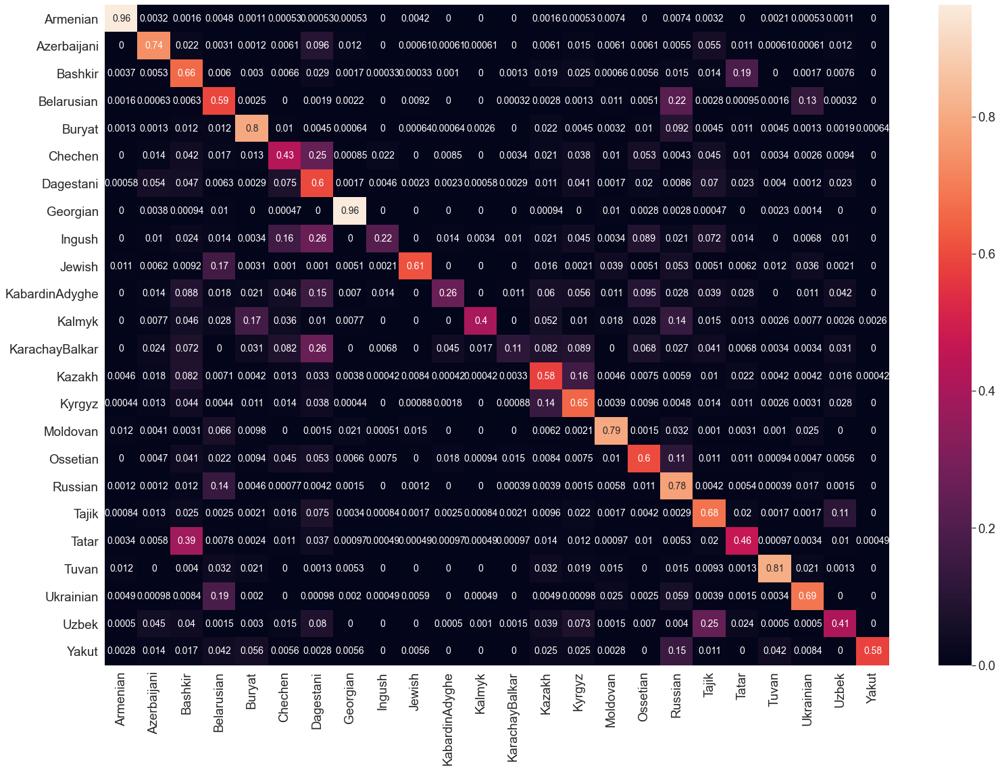

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9597	0.9486	0.9597	0.9541
Azerbaijani    	0.7391	0.7525	0.7391	0.7457
Bashkir        	0.6619	0.5502	0.6619	0.6009
Belarusian     	0.5927	0.5946	0.5927	0.5937
Buryat         	0.7987	0.8285	0.7987	0.8133
Chechen        	0.4313	0.5096	0.4313	0.4672
Dagestani      	0.5982	0.4246	0.5982	0.4967
Georgian       	0.9634	0.9409	0.9634	0.9520
Ingush         	0.2158	0.5250	0.2158	0.3058
Jewish         	0.6144	0.8366	0.6144	0.7085
KabardinAdyghe 	0.2570	0.5141	0.2570	0.3427
Kalmyk         	0.3995	0.8857	0.3995	0.5506
KarachayBalkar 	0.1130	0.3667	0.1130	0.1728
Kazakh         	0.5830	0.6430	0.5830	0.6115
Kyrgyz         	0.6512	0.6120	0.6512	0.6310
Moldovan       	0.7941	0.8515	0.7941	0.8218
Ossetian       	0.6032	0.6335	0.6032	0.6180
Russian        	0.7792	0.5762	0.7792	0.6625
Tajik          	0.6783	0.6106	0.6783	0.6427
Tatar          	0.4634	0.5151	0.4634	0.4879
Tuvan          	0.8107	0.8636	0.8107	0.8363
Ukrainian      	0.6877	0.6877	0.6877	0.6877


In [8]:
rf = proc_model(RandomForestClassifier(),
                 {'random_state': [0], 'n_estimators': [300], 'max_depth': [None, 50, 100]},
                 le, X_train[:20000], y_train[:20000], X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.01, 0.05, 0.1],
                     'min_df': [1],
                     'lowercase': [False],
                 }, cv=2)

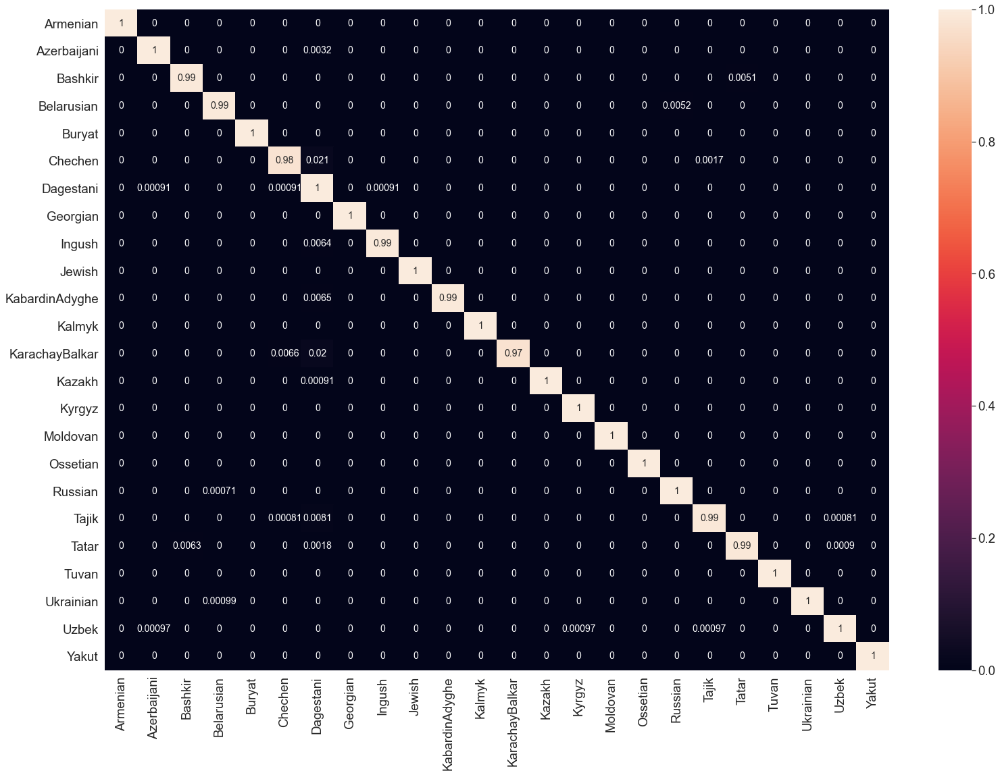

Ethnos          Acc	Prec	Rec	F1
Armenian       	1.0000	1.0000	1.0000	1.0000
Azerbaijani    	0.9968	0.9978	0.9968	0.9973
Bashkir        	0.9949	0.9956	0.9949	0.9953
Belarusian     	0.9948	0.9987	0.9948	0.9968
Buryat         	1.0000	1.0000	1.0000	1.0000
Chechen        	0.9775	0.9947	0.9775	0.9861
Dagestani      	0.9973	0.9708	0.9973	0.9839
Georgian       	1.0000	1.0000	1.0000	1.0000
Ingush         	0.9936	0.9936	0.9936	0.9936
Jewish         	1.0000	1.0000	1.0000	1.0000
KabardinAdyghe 	0.9935	1.0000	0.9935	0.9968
Kalmyk         	1.0000	1.0000	1.0000	1.0000
KarachayBalkar 	0.9737	1.0000	0.9737	0.9867
Kazakh         	0.9991	1.0000	0.9991	0.9995
Kyrgyz         	1.0000	0.9991	1.0000	0.9995
Moldovan       	1.0000	1.0000	1.0000	1.0000
Ossetian       	1.0000	1.0000	1.0000	1.0000
Russian        	0.9993	0.9944	0.9993	0.9968
Tajik          	0.9903	0.9984	0.9903	0.9943
Tatar          	0.9910	0.9928	0.9910	0.9919
Tuvan          	1.0000	1.0000	1.0000	1.0000
Ukrainian      	0.9990	1.0000	0.9990	0.9995


{'accuracy': 0.99655,
 'precision macro': 0.9972502138369231,
 'recall macro': 0.995752984501253,
 'f1 macro': 0.9964821554212834}

In [9]:
test_model(rf, le, X_train[:20000], y_train[:20000])

Fitting 2 folds for each of 3 candidates, totalling 6 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   4 out of   6 | elapsed:  7.3min remaining:  3.7min
[Parallel(n_jobs=6)]: Done   6 out of   6 | elapsed:  7.5min finished


{'model__max_depth': None, 'model__n_estimators': 300, 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.2, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


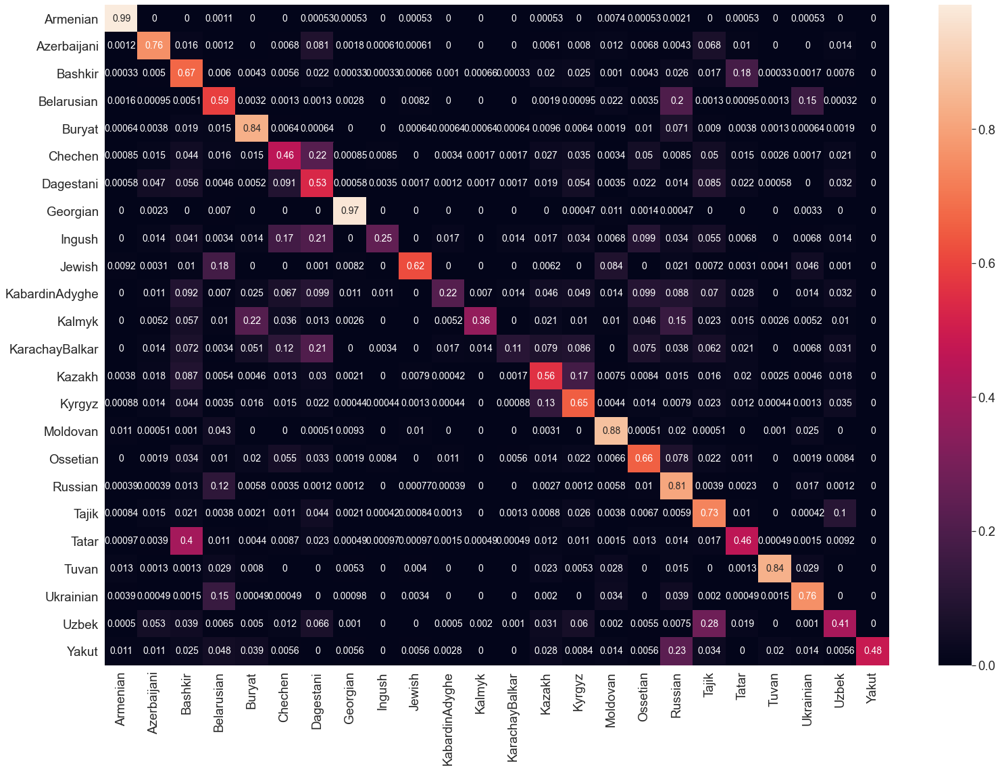

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9857	0.9587	0.9857	0.9720
Azerbaijani    	0.7606	0.7658	0.7606	0.7632
Bashkir        	0.6719	0.5488	0.6719	0.6042
Belarusian     	0.5905	0.6323	0.5905	0.6107
Buryat         	0.8353	0.8195	0.8353	0.8273
Chechen        	0.4577	0.5066	0.4577	0.4809
Dagestani      	0.5325	0.4655	0.5325	0.4968
Georgian       	0.9737	0.9660	0.9737	0.9699
Ingush         	0.2466	0.6729	0.2466	0.3609
Jewish         	0.6195	0.8653	0.6195	0.7221
KabardinAdyghe 	0.2183	0.5794	0.2183	0.3171
Kalmyk         	0.3634	0.8812	0.3634	0.5146
KarachayBalkar 	0.1062	0.4844	0.1062	0.1742
Kazakh         	0.5592	0.6622	0.5592	0.6063
Kyrgyz         	0.6516	0.6117	0.6516	0.6310
Moldovan       	0.8755	0.8108	0.8755	0.8419
Ossetian       	0.6557	0.6454	0.6557	0.6505
Russian        	0.8089	0.5999	0.8089	0.6889
Tajik          	0.7332	0.5948	0.7332	0.6568
Tatar          	0.4609	0.5416	0.4609	0.4980
Tuvan          	0.8360	0.9457	0.8360	0.8875
Ukrainian      	0.7600	0.6900	0.7600	0.7233


In [5]:
rf = proc_model(RandomForestClassifier(),
                 {'random_state': [0], 'n_estimators': [300], 'max_depth': [None, 500, 1000]},
                 le, X_train[:20000], y_train[:20000], X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.2],
                     'min_df': [1],
                     'lowercase': [False],
                 }, cv=2)

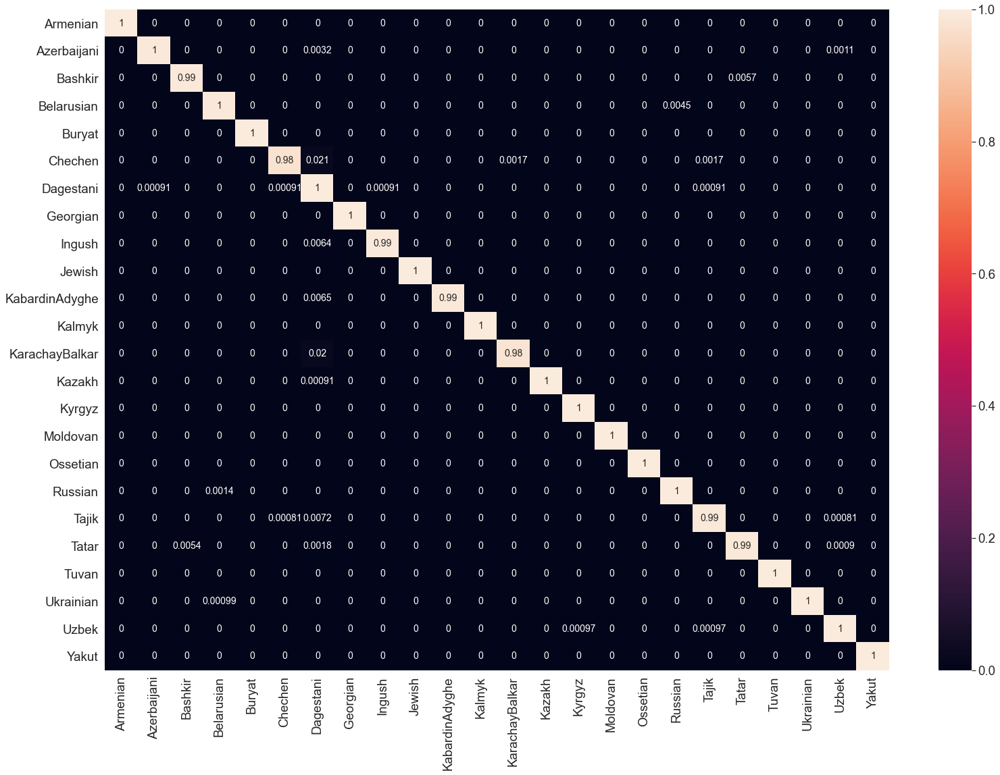

Ethnos          Acc	Prec	Rec	F1
Armenian       	1.0000	1.0000	1.0000	1.0000
Azerbaijani    	0.9957	0.9989	0.9957	0.9973
Bashkir        	0.9943	0.9962	0.9943	0.9952
Belarusian     	0.9955	0.9981	0.9955	0.9968
Buryat         	1.0000	1.0000	1.0000	1.0000
Chechen        	0.9758	0.9965	0.9758	0.9860
Dagestani      	0.9964	0.9717	0.9964	0.9839
Georgian       	1.0000	1.0000	1.0000	1.0000
Ingush         	0.9936	0.9936	0.9936	0.9936
Jewish         	1.0000	1.0000	1.0000	1.0000
KabardinAdyghe 	0.9935	1.0000	0.9935	0.9968
Kalmyk         	1.0000	1.0000	1.0000	1.0000
KarachayBalkar 	0.9803	0.9933	0.9803	0.9868
Kazakh         	0.9991	1.0000	0.9991	0.9995
Kyrgyz         	1.0000	0.9991	1.0000	0.9995
Moldovan       	1.0000	1.0000	1.0000	1.0000
Ossetian       	1.0000	1.0000	1.0000	1.0000
Russian        	0.9986	0.9951	0.9986	0.9968
Tajik          	0.9911	0.9976	0.9911	0.9943
Tatar          	0.9919	0.9919	0.9919	0.9919
Tuvan          	1.0000	1.0000	1.0000	1.0000
Ukrainian      	0.9990	1.0000	0.9990	0.9995


{'accuracy': 0.99655,
 'precision macro': 0.9970425410936072,
 'recall macro': 0.9959546142107901,
 'f1 macro': 0.9964845542796904}

In [6]:
test_model(rf, le, X_train[:20000], y_train[:20000])

Fitting 2 folds for each of 6 candidates, totalling 12 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 out of  12 | elapsed:  5.2min remaining:  5.2min
[Parallel(n_jobs=6)]: Done  12 out of  12 | elapsed:  7.4min finished


{'model__max_depth': None, 'model__n_estimators': 300, 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.1, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


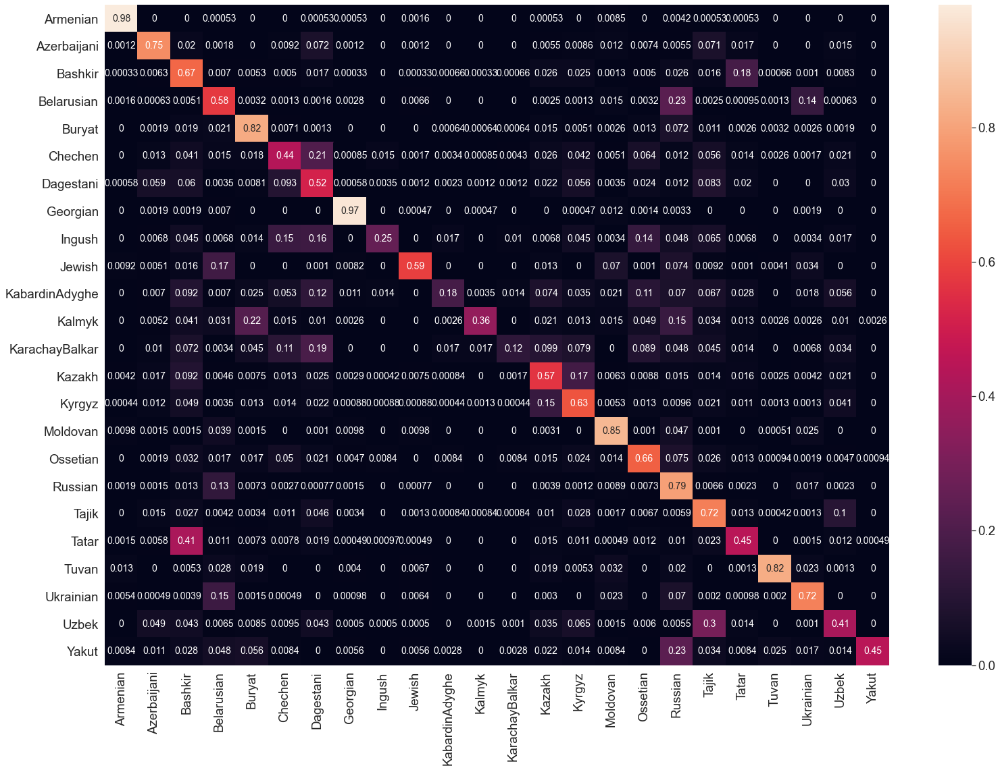

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9825	0.9586	0.9825	0.9704
Azerbaijani    	0.7520	0.7599	0.7520	0.7559
Bashkir        	0.6712	0.5356	0.6712	0.5958
Belarusian     	0.5782	0.6197	0.5782	0.5982
Buryat         	0.8199	0.7929	0.8199	0.8062
Chechen        	0.4364	0.5095	0.4364	0.4701
Dagestani      	0.5158	0.4902	0.5158	0.5027
Georgian       	0.9695	0.9623	0.9695	0.9659
Ingush         	0.2534	0.6325	0.2534	0.3619
Jewish         	0.5887	0.8542	0.5887	0.6970
KabardinAdyghe 	0.1796	0.5795	0.1796	0.2742
Kalmyk         	0.3634	0.8758	0.3634	0.5137
KarachayBalkar 	0.1199	0.4930	0.1199	0.1928
Kazakh         	0.5655	0.6347	0.5655	0.5981
Kyrgyz         	0.6319	0.5996	0.6319	0.6153
Moldovan       	0.8487	0.8224	0.8487	0.8354
Ossetian       	0.6557	0.6258	0.6557	0.6404
Russian        	0.7908	0.5513	0.7908	0.6497
Tajik          	0.7185	0.5750	0.7185	0.6388
Tatar          	0.4469	0.5386	0.4469	0.4885
Tuvan          	0.8227	0.9334	0.8227	0.8746
Ukrainian      	0.7245	0.6965	0.7245	0.7102


In [5]:
rf = proc_model(RandomForestClassifier(),
                 {'random_state': [0], 'n_estimators': [300], 'max_depth': [None]},
                 le, X_train[:20000], y_train[:20000], X_test, y_test, 
                 vectorization='tfidf', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.1, 0.3, 0.5],
                     'min_df': [1, 10],
                     'lowercase': [False],
                 }, cv=2)

Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   3 out of   8 | elapsed:  1.3min remaining:  2.1min
[Parallel(n_jobs=6)]: Done   6 out of   8 | elapsed:  2.1min remaining:   41.6s
[Parallel(n_jobs=6)]: Done   8 out of   8 | elapsed:  3.3min finished


{'model__max_depth': None, 'model__n_estimators': 200, 'model__random_state': 0, 'vect__analyzer': 'char', 'vect__lowercase': False, 'vect__max_df': 0.2, 'vect__min_df': 1, 'vect__ngram_range': (1, 5)}


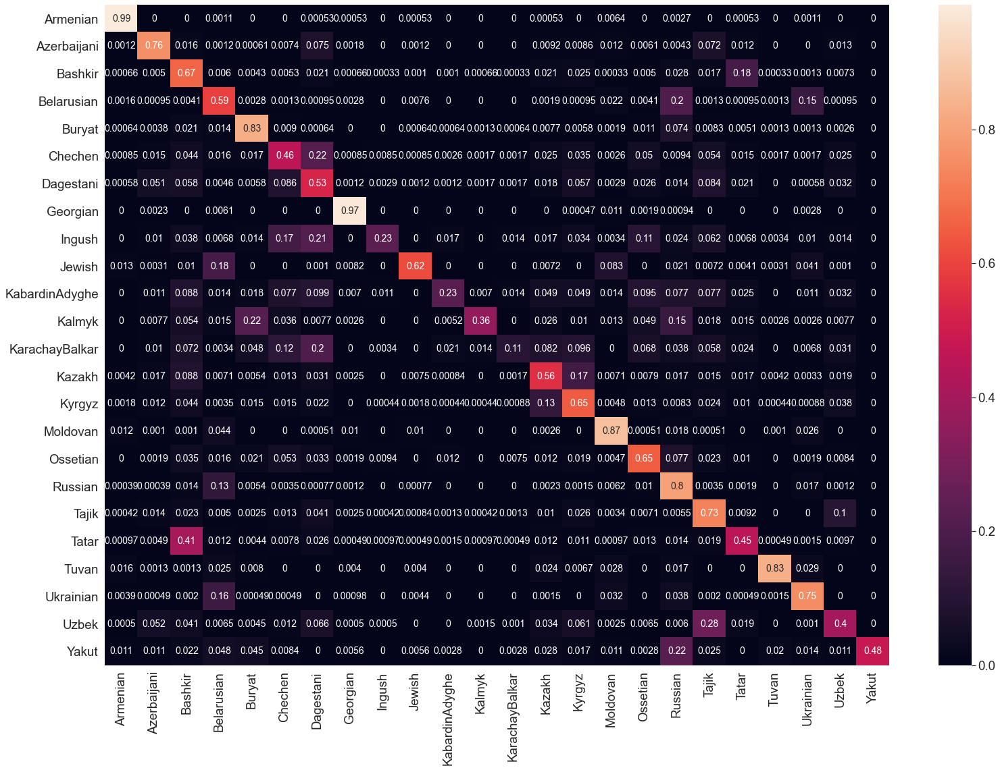

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9862	0.9533	0.9862	0.9695
Azerbaijani    	0.7587	0.7653	0.7587	0.7620
Bashkir        	0.6682	0.5441	0.6682	0.5998
Belarusian     	0.5927	0.6230	0.5927	0.6075
Buryat         	0.8288	0.8163	0.8288	0.8225
Chechen        	0.4569	0.5066	0.4569	0.4805
Dagestani      	0.5296	0.4687	0.5296	0.4973
Georgian       	0.9747	0.9652	0.9747	0.9699
Ingush         	0.2329	0.6602	0.2329	0.3443
Jewish         	0.6185	0.8639	0.6185	0.7209
KabardinAdyghe 	0.2254	0.5872	0.2254	0.3257
Kalmyk         	0.3608	0.8642	0.3608	0.5091
KarachayBalkar 	0.1062	0.4627	0.1062	0.1727
Kazakh         	0.5579	0.6591	0.5579	0.6043
Kyrgyz         	0.6507	0.6099	0.6507	0.6296
Moldovan       	0.8724	0.8157	0.8724	0.8431
Ossetian       	0.6548	0.6404	0.6548	0.6475
Russian        	0.8008	0.5959	0.8008	0.6833
Tajik          	0.7290	0.5902	0.7290	0.6523
Tatar          	0.4537	0.5405	0.4537	0.4933
Tuvan          	0.8347	0.9428	0.8347	0.8854
Ukrainian      	0.7545	0.6941	0.7545	0.7231


In [5]:
rf = proc_model(RandomForestClassifier(),
                 {'random_state': [0], 'n_estimators': [25, 50, 100, 200], 'max_depth': [None]},
                 le, X_train[:20000], y_train[:20000], X_test, y_test, 
                 vectorization='count', vect_params={
                     'analyzer': ['char'],
                     'ngram_range': [(1, 5)],
                     'max_df': [0.2],
                     'min_df': [1],
                     'lowercase': [False],
                 }, cv=2)

In [5]:
rf = Pipeline(steps=[
    ('vect', CountVectorizer(analyzer='char', ngram_range=(1, 5), max_df=0.2, min_df=1, lowercase=False)),
    ('estimator', RandomForestClassifier(n_estimators=300, max_depth=100, random_state=0, n_jobs=6))])

In [6]:
rf.fit(X_train, y_train)

Pipeline(steps=[('vect',
                 CountVectorizer(analyzer='char', lowercase=False, max_df=0.2,
                                 ngram_range=(1, 5))),
                ('estimator',
                 RandomForestClassifier(max_depth=100, n_estimators=300,
                                        n_jobs=6, random_state=0))])

Pipeline(steps=[('vect',
                 CountVectorizer(analyzer='char', lowercase=False, max_df=0.2,
                                 ngram_range=(1, 5))),
                ('estimator',
                 RandomForestClassifier(max_depth=100, n_estimators=300,
                                        n_jobs=6, random_state=0))])

Pipeline(steps=[('vect',
                 CountVectorizer(analyzer='char', lowercase=False, max_df=0.2,
                                 ngram_range=(1, 5))),
                ('estimator',
                 RandomForestClassifier(max_depth=100, n_estimators=300,
                                        n_jobs=6, random_state=0))])

Pipeline(steps=[('vect',
                 CountVectorizer(analyzer='char', lowercase=False, max_df=0.2,
                                 ngram_range=(1, 5))),
                ('estimator',
                 RandomForestClassifier(max_depth=100, n_estimators=300,
                                        n_jobs=6, random_state=0))])

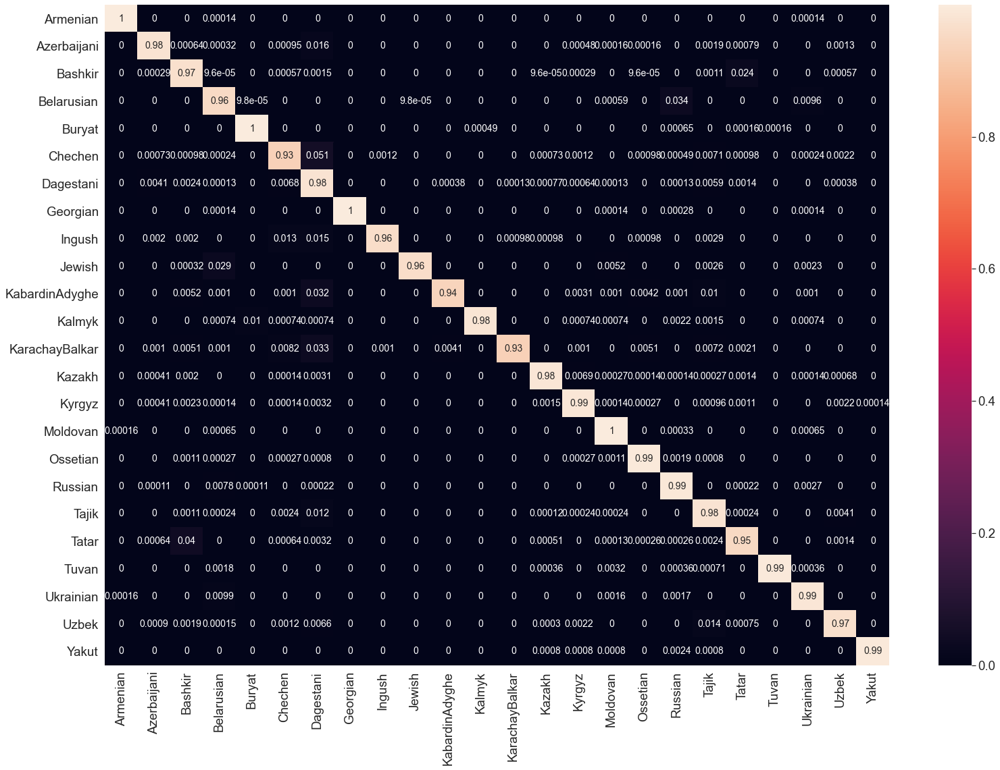

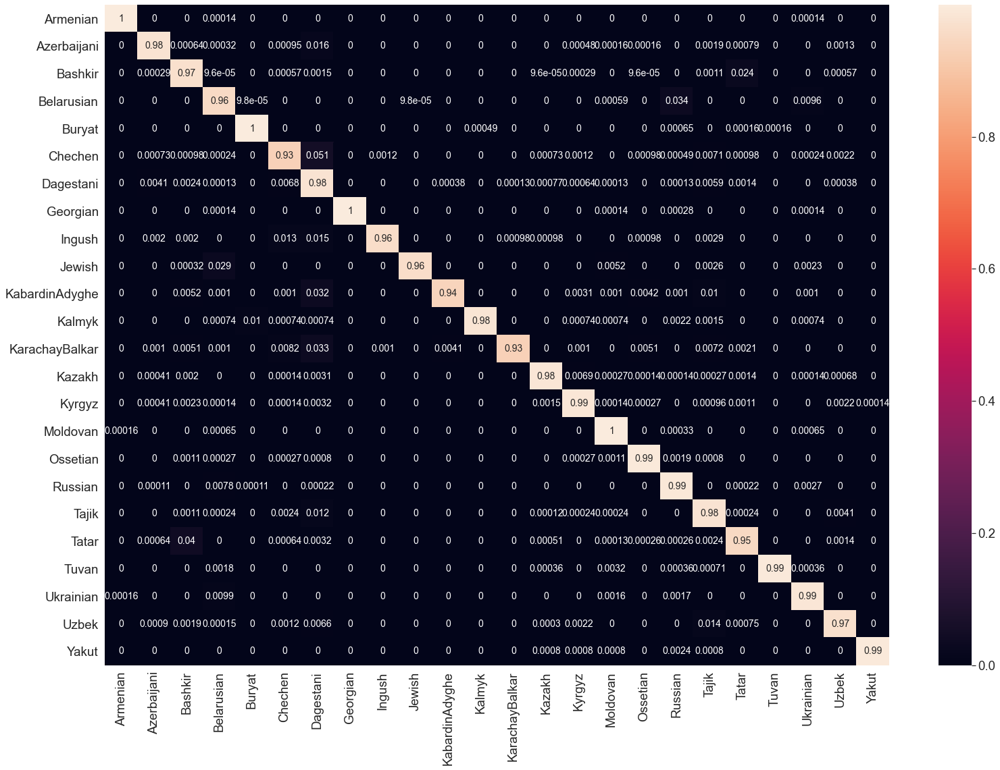

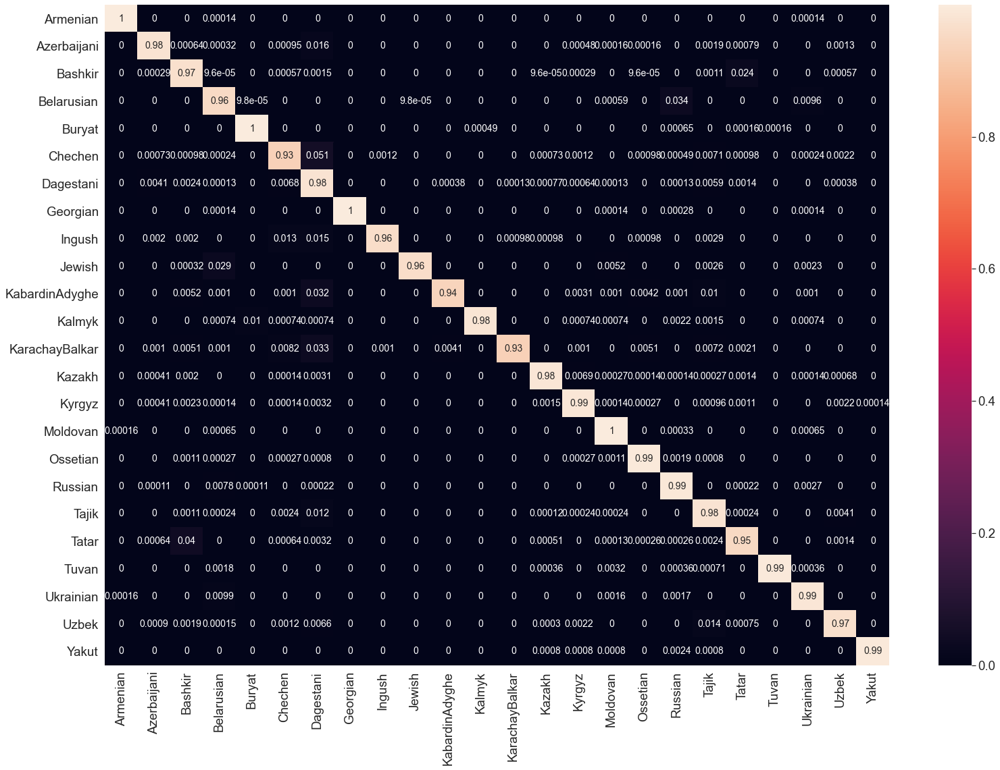

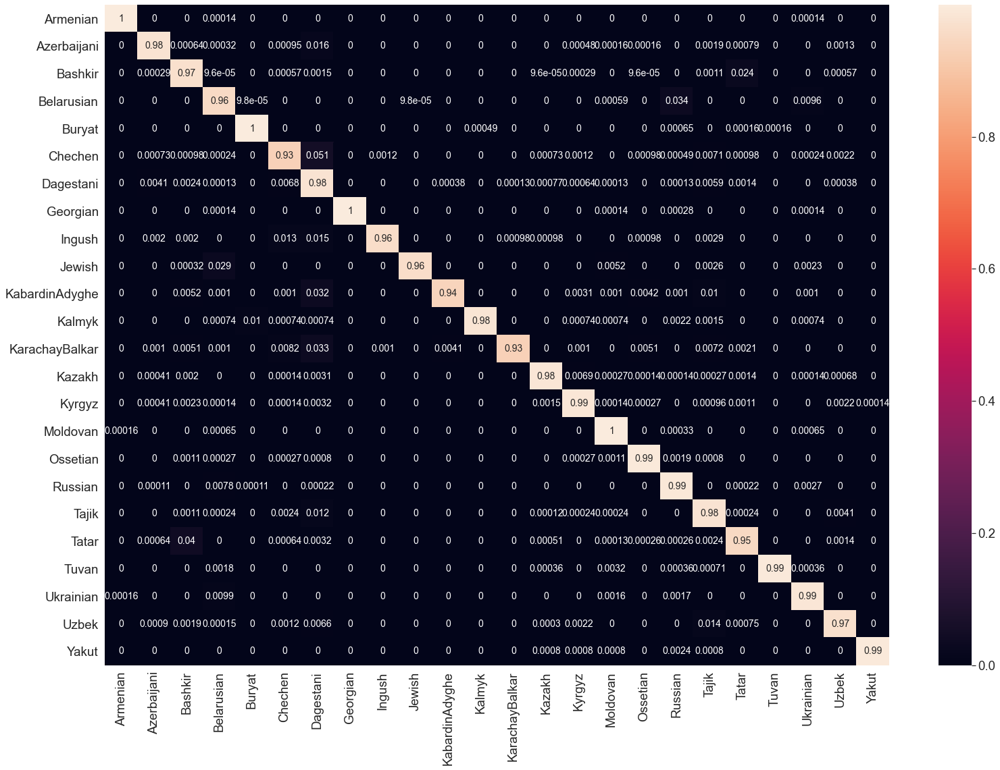

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9997	0.9997	0.9997	0.9997
Azerbaijani    	0.9776	0.9905	0.9776	0.9840
Bashkir        	0.9714	0.9609	0.9714	0.9661
Belarusian     	0.9553	0.9752	0.9553	0.9652
Buryat         	0.9985	0.9974	0.9985	0.9980
Chechen        	0.9315	0.9684	0.9315	0.9496
Dagestani      	0.9767	0.9241	0.9767	0.9497
Georgian       	0.9993	1.0000	0.9993	0.9997
Ingush         	0.9629	0.9939	0.9629	0.9782
Jewish         	0.9607	0.9997	0.9607	0.9798
KabardinAdyghe 	0.9393	0.9923	0.9393	0.9651
Kalmyk         	0.9816	0.9978	0.9816	0.9896
KarachayBalkar 	0.9311	0.9978	0.9311	0.9633
Kazakh         	0.9843	0.9957	0.9843	0.9900
Kyrgyz         	0.9875	0.9875	0.9875	0.9875
Moldovan       	0.9982	0.9907	0.9982	0.9945
Ossetian       	0.9936	0.9944	0.9936	0.9940
Russian        	0.9889	0.9592	0.9889	0.9738
Tajik          	0.9788	0.9692	0.9788	0.9740
Tatar          	0.9501	0.9611	0.9501Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9997	0.9997	0.9997	0.9997
Azerbaijani    	0.97

{'accuracy': 0.9784073255258127,
 'precision macro': 0.9841019328878827,
 'recall macro': 0.9755519606241713,
 'f1 macro': 0.9796495823178493}

{'accuracy': 0.9784073255258127,
 'precision macro': 0.9841019328878827,
 'recall macro': 0.9755519606241713,
 'f1 macro': 0.9796495823178493}

{'accuracy': 0.9784073255258127,
 'precision macro': 0.9841019328878827,
 'recall macro': 0.9755519606241713,
 'f1 macro': 0.9796495823178493}

{'accuracy': 0.9784073255258127,
 'precision macro': 0.9841019328878827,
 'recall macro': 0.9755519606241713,
 'f1 macro': 0.9796495823178493}

In [7]:
test_model(rf, le, X_train, y_train)

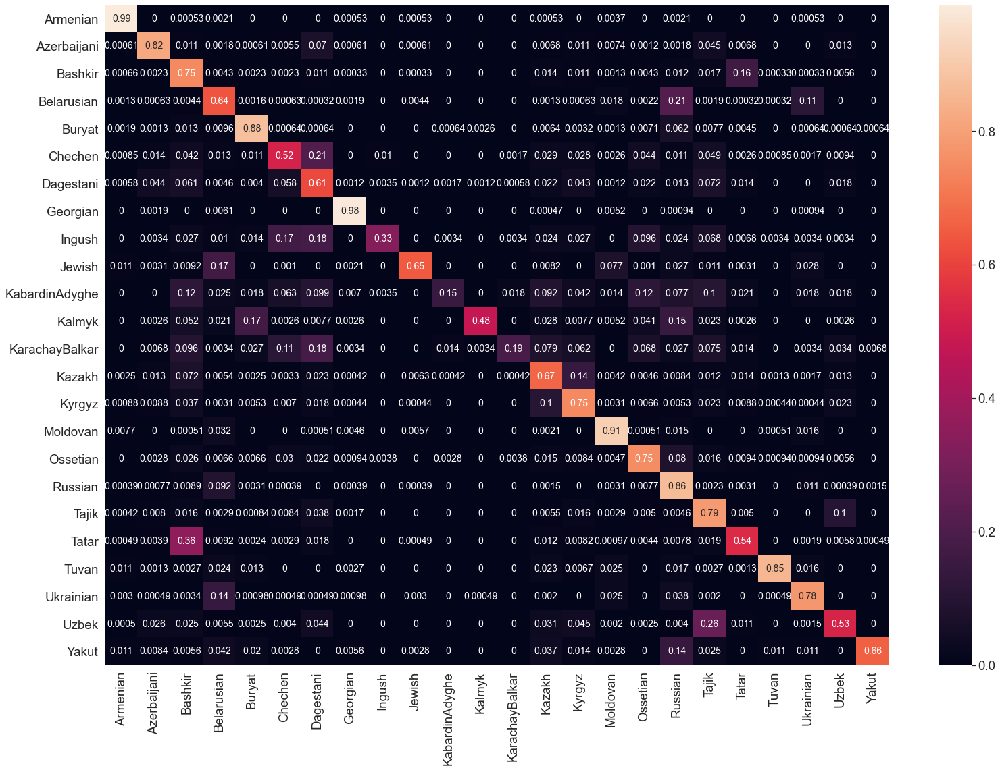

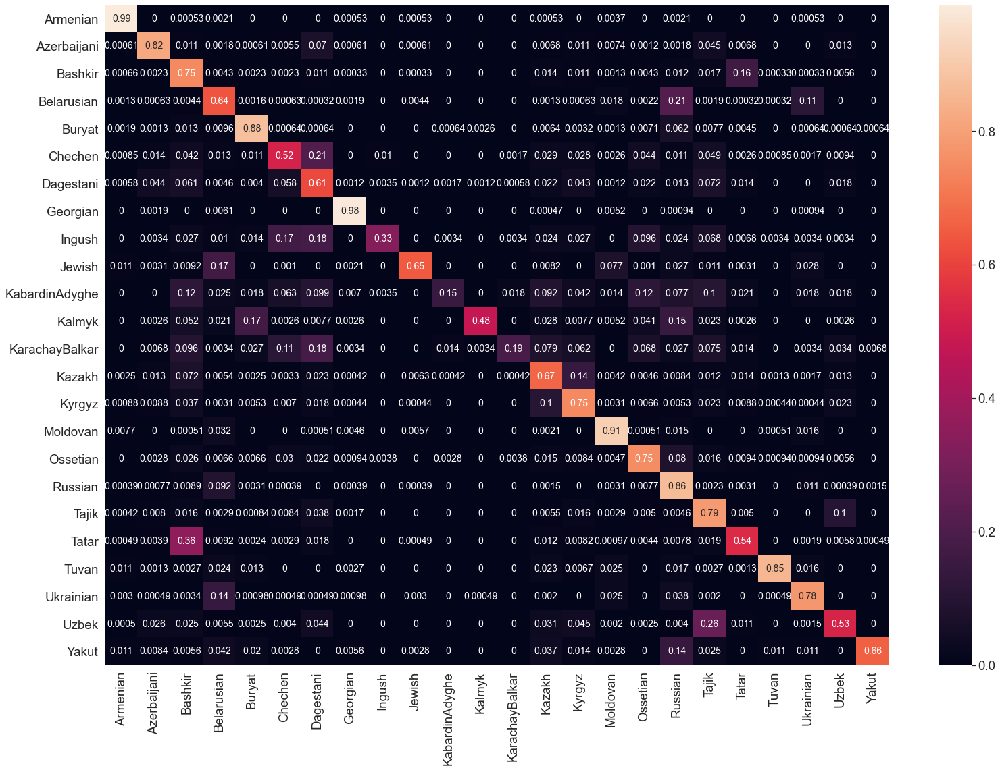

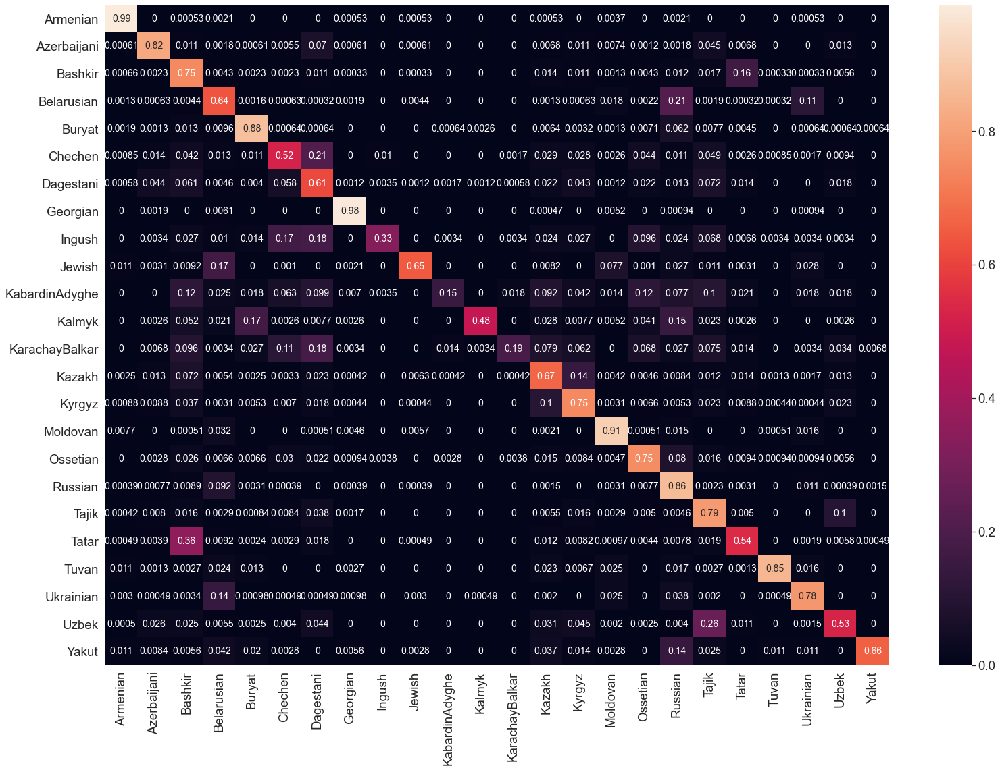

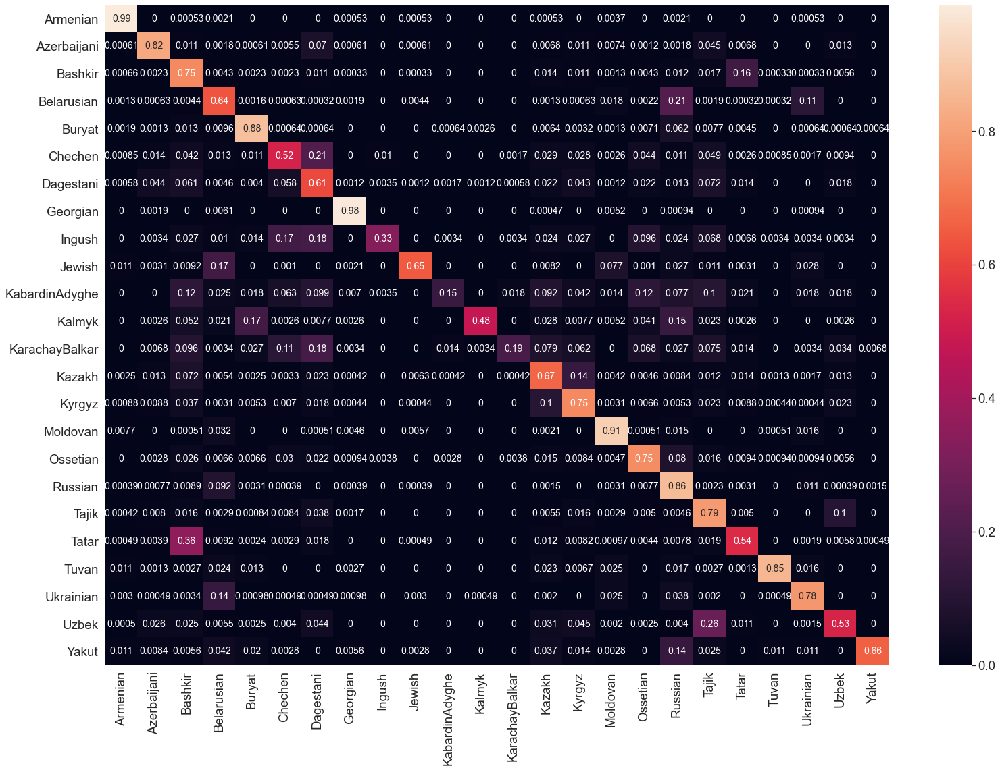

Ethnos          Acc	Prec	Rec	F1
Armenian       	0.9894	0.9648	0.9894	0.9770
Azerbaijani    	0.8165	0.8386	0.8165	0.8274
Bashkir        	0.7469	0.6082	0.7469	0.6704
Belarusian     	0.6370	0.6811	0.6370	0.6583
Buryat         	0.8756	0.8830	0.8756	0.8793
Chechen        	0.5243	0.6624	0.5243	0.5853
Dagestani      	0.6137	0.5526	0.6137	0.5816
Georgian       	0.9845	0.9813	0.9845	0.9829
Ingush         	0.3322	0.8083	0.3322	0.4709
Jewish         	0.6482	0.9199	0.6482	0.7605
KabardinAdyghe 	0.1479	0.7636	0.1479	0.2478
Kalmyk         	0.4794	0.9588	0.4794	0.6392
KarachayBalkar 	0.1884	0.7971	0.1884	0.3047
Kazakh         	0.6713	0.7266	0.6713	0.6978
Kyrgyz         	0.7480	0.7065	0.7480	0.7267
Moldovan       	0.9146	0.8589	0.9146	0.8858
Ossetian       	0.7542	0.7322	0.7542	0.7431
Russian        	0.8628	0.6334	0.8628	0.7305
Tajik          	0.7857	0.6289	0.7857	0.6986
Tatar          	0.5449	0.6288	0.5449	0.5838
Tuvan          	0.8533	0.9771	0.8533	0.9110
Ukrainian      	0.7777	0.7682	0.7777	0.7729


{'accuracy': 0.7361950406334653,
 'precision macro': 0.7814867007209069,
 'recall macro': 0.6701270698509334,
 'f1 macro': 0.6968368689081342}

{'accuracy': 0.7361950406334653,
 'precision macro': 0.7814867007209069,
 'recall macro': 0.6701270698509334,
 'f1 macro': 0.6968368689081342}

{'accuracy': 0.7361950406334653,
 'precision macro': 0.7814867007209069,
 'recall macro': 0.6701270698509334,
 'f1 macro': 0.6968368689081342}

{'accuracy': 0.7361950406334653,
 'precision macro': 0.7814867007209069,
 'recall macro': 0.6701270698509334,
 'f1 macro': 0.6968368689081342}

In [8]:
test_model(rf, le, X_test, y_test)

# Data fraction 

In [53]:
import matplotlib.pyplot as plt

sns.set(rc={'figure.figsize': (7, 4.2)})
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.sans-serif'] = "Arial"
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams['grid.alpha'] = 0.3
sns.set(font_scale=1.)

In [54]:
def get_scores(model, le, X, y):
    pred = model.predict(X)

    # Estimate metrics for model
    return {
        'Accuracy': accuracy_score(y, pred),
        'Precision': precision_score(y, pred, average='macro'),
        'Recall': recall_score(y, pred, average='macro'),
        'F1': f1_score(y, pred, average='macro'),
    }

In [55]:
vect = CountVectorizer(analyzer='char', lowercase=False, max_df=0.65, min_df=1, ngram_range=(1, 5))
svm = SGDClassifier(alpha=2.5e-05, class_weight=None, early_stopping=False, loss='hinge', penalty='elasticnet', random_state=0)

In [56]:
REPEATS = 5

metrics = {'Accuracy': [], 
           'Precision': [], 
           'Recall': [], 
           'F1': []}
sizes = []

fracs = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
for frac in fracs:
    size = int(frac * len(X_train))
    sizes.append(size)
    
    for _ in range(REPEATS):
        inds = np.random.permutation(len(X_train))
        X_train_v = vect.fit_transform(X_train[inds][:size])
        X_test_v = vect.transform(X_test)

        svm.fit(X_train_v, y_train[inds][:size])

        scores = get_scores(svm, le, X_test_v, y_test)
    
        for metric in scores:
            metrics[metric].append(scores[metric])

In [57]:
means = {'Accuracy': [], 
           'Precision': [], 
           'Recall': [], 
           'F1': []}
stds = {'Accuracy': [], 
           'Precision': [], 
           'Recall': [], 
           'F1': []}

for metric in metrics:
    for i in range(len(fracs)):
        means[metric].append(np.mean(metrics[metric][i * REPEATS : (i + 1) * REPEATS]))
        stds[metric].append(np.std(metrics[metric][i * REPEATS : (i + 1) * REPEATS]))
    means[metric] = np.array(means[metric])
    stds[metric] = np.array(stds[metric])

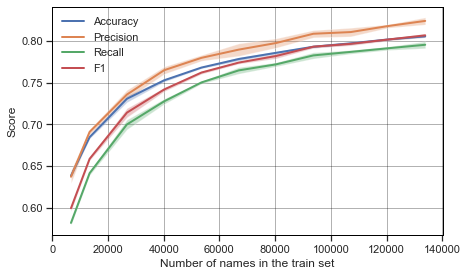

In [62]:
import matplotlib    
matplotlib.rc('axes',edgecolor='black')

plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['axes.linewidth'] = 1
clrs = sns.color_palette("deep", len(means))

for i, metric in enumerate(metrics):
    plt.plot(sizes, means[metric], label=metric, c=clrs[i], linewidth=2.0)
    plt.fill_between(sizes, means[metric] - stds[metric], means[metric] + stds[metric], facecolor=clrs[i], alpha=0.3)
#plt.axvline(x=len(X_test), color='k', linestyle='--', label='Number of samples for testing')
plt.legend(frameon=False)
plt.xlabel('Number of names in the train set', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.grid(c='black')
plt.tick_params(axis='both', which='major', bottom=True, left=True)
plt.xticks(np.arange(0, 150000, 20000))
plt.savefig('train_size.tif', bbox_inches='tight')
plt.show()